In [1]:
!pip install torch torchvision

In [2]:
# Mount Drive
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import string
import re
%matplotlib inline
sns.set_style("whitegrid")

# Warnings
import warnings
warnings.filterwarnings('ignore')

In [4]:
df = pd.read_csv("/content/drive/MyDrive/reviews.csv")

print(len(df))
df

10743


,ID,CompanyName,Review,Date,OwnershipType
0,1,united_american,United American has been fantastic. We have ha...,4/22/2023,Public
1,2,united_american,We've had very good luck with United American....,10/28/2022,Public
2,3,united_american,We've had a United American Insurance policy f...,10/12/2022,Public
3,4,united_american,We were with Cleveland Clinic and when they st...,09/01/2022,Public
4,5,united_american,My husband worked for a bank and we had a life...,5/30/2022,Public
...,...,...,...,...,...
10738,10739,american_republic,Abusive unexplained rate increases and unexpla...,08/01/2006,Private
10739,10740,american_republic,Despite a deductible of $4000 and a co-insuran...,1/29/2006,Private
10740,10741,american_republic,I have 2 complaints against this company. We s...,8/26/2005,Private
10741,10742,american_republic,"We had insurance on both our sons, one who liv...",08/02/2005,Private


In [5]:
pip install tabulate

In [6]:
pip install colorama

In [9]:
import pandas as pd
import re
from tabulate import tabulate
from colorama import Fore, Style

# Step 1: Remove missing values
print(f"{Fore.RED}Step 1: Removing missing values...{Style.RESET_ALL}")
df.dropna(inplace=True)

def clean_text(text):
    text = re.sub(r"\s+", " ", text).strip()  # Remove extra spaces and strip leading/trailing spaces
    text = text.lower()  # Convert text to lowercase
    return text

# Step 2: Apply text cleaning to the 'Review' column
print(f"{Fore.GREEN}Step 2: Cleaning text in the 'Review' column...{Style.RESET_ALL}")
df['Review'] = df['Review'].apply(clean_text)

# Step 3: Display the first 10 rows of the preprocessed DataFrame
print(f"{Fore.CYAN}Step 3: Displaying the first 10 rows of the preprocessed DataFrame...{Style.RESET_ALL}")

df.head(10)

Step 1: Removing missing values...
Step 2: Cleaning text in the 'Review' column...
Step 3: Displaying the first 10 rows of the preprocessed DataFrame...


,ID,CompanyName,Review,Date,OwnershipType
0,1,united_american,united american has been fantastic. we have ha...,4/22/2023,Public
1,2,united_american,we've had very good luck with united american....,10/28/2022,Public
2,3,united_american,we've had a united american insurance policy f...,10/12/2022,Public
3,4,united_american,we were with cleveland clinic and when they st...,09/01/2022,Public
4,5,united_american,my husband worked for a bank and we had a life...,5/30/2022,Public
5,6,united_american,i'm very happy with united american insurance....,4/23/2023,Public
6,7,united_american,a lady in blacksburg helped me with my insuran...,4/21/2023,Public
7,8,united_american,"whenever i have a problem, i can call the prov...",04/11/2023,Public
8,9,united_american,i'm satisfied with united american. my payment...,3/30/2023,Public
9,10,united_american,"so far, united american has been very good. ev...",3/29/2023,Public


In [10]:
import pandas as pd
import spacy
from tqdm import tqdm
from termcolor import colored
from colorama import Fore, Style

nlp = spacy.load("en_core_web_sm")

def summarize_review(review_text):
    if pd.notna(review_text) and review_text.strip() != "":
        doc = nlp(review_text)
        sentences = [sent.text for sent in doc.sents]
        summary = " ".join(sentences[:2])
        return summary
    else:
        return ""

print(f"{Fore.CYAN}Reading the preprocessed CSV file...{Style.RESET_ALL}")

print(f"{Fore.CYAN}Summarizing reviews...{Style.RESET_ALL}")
tqdm.pandas(desc=f"{Fore.YELLOW}Progress{Style.RESET_ALL}")
df["Summary"] = df["Review"].progress_apply(summarize_review)

print(f"{Fore.CYAN}Saving summarized data to a new CSV file...{Style.RESET_ALL}")
df.to_csv("summarized_reviews.csv", index=False)

print(f"{Fore.GREEN}Summarization process completed successfully!{Style.RESET_ALL}")

Reading the preprocessed CSV file...
Summarizing reviews...


Progress: 100%|██████████| 10741/10741 [06:36<00:00, 27.11it/s]


Saving summarized data to a new CSV file...
Displaying the first 10 rows of the preprocessed DataFrame...
╒════╤══════╤═════════════════╤═══════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════

In [17]:
import pandas as pd
from nltk.sentiment.vader import SentimentIntensityAnalyzer
import nltk
from termcolor import colored

nltk.download('vader_lexicon')

analyzer = SentimentIntensityAnalyzer()

def classify_words(text):
    if isinstance(text, str):
        sentiment = analyzer.polarity_scores(text)
        compound_score = sentiment['compound']
        if compound_score >= 0.05:
            return 'positive'
        elif compound_score <= -0.05:
            return 'negative'
        else:
            return 'neutral'
    else:
        return 'neutral'

df['Sentiment'] = df['Summary'].apply(classify_words)

def extract_and_classify_words(text, sentiment):
    if isinstance(text, str):
        words = text.split()
        positive_words = []
        negative_words = []
        for word in words:
            word_sentiment = classify_words(word)
            if word_sentiment == 'positive' and sentiment == 'positive':
                positive_words.append(word)
            elif word_sentiment == 'negative' and sentiment == 'negative':
                negative_words.append(word)
        return ', '.join(positive_words), ', '.join(negative_words)
    else:
        return '', ''

df['Positive'] = df.apply(lambda x: extract_and_classify_words(x['Review'], x['Sentiment'])[0], axis=1)
df['Negative'] = df.apply(lambda x: extract_and_classify_words(x['Review'], x['Sentiment'])[1], axis=1)

print(colored("Step 1: Classifying words as positive, negative, or neutral...", "cyan"))

def map_sentiment_to_binary(sentiment):
    if sentiment == 'positive':
        return 1
    else:
        return 0

df['Binary_Sentiment'] = df['Sentiment'].apply(map_sentiment_to_binary)

df.to_csv('summarized_reviews.csv', index=False)

print(f"{Fore.CYAN}Displaying the first 10 rows of the DataFrame with sentiment analysis results...{Style.RESET_ALL}")

df[['Summary', 'Sentiment', 'Binary_Sentiment', 'Positive', 'Negative']].head(10)



[nltk_data] Downloading package vader_lexicon to /root/nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


Step 1: Classifying words as positive, negative, or neutral...
Displaying the first 10 rows of the DataFrame with sentiment analysis results...


,Summary,Sentiment,Binary_Sentiment,Positive,Negative
0,united american has been fantastic. we have ha...,positive,1,"united, fantastic., happy., pretty, united, un...",
1,we've had very good luck with united american....,positive,1,"good, luck, united, united, satisfied, good.",
2,we've had a united american insurance policy f...,positive,1,"united, excellent., like, enjoyed, fabulous,, ...",
3,we were with cleveland clinic and when they st...,positive,1,"united, good, fair, united, united",
4,my husband worked for a bank and we had a life...,neutral,0,,
5,i'm very happy with united american insurance....,positive,1,"happy, united, great.",
6,a lady in blacksburg helped me with my insuran...,neutral,0,,
7,"whenever i have a problem, i can call the prov...",negative,0,,"problem,, problem"
8,i'm satisfied with united american. my payment...,positive,1,"satisfied, united, like, united, care",
9,"so far, united american has been very good. ev...",positive,1,"united, good., care, pleased.",


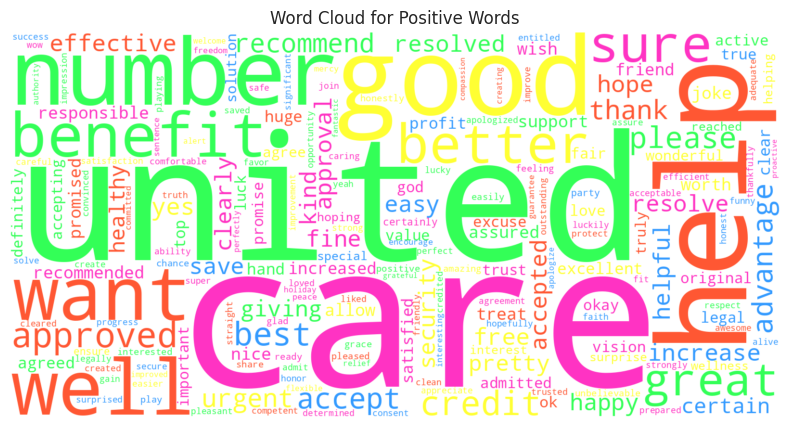

In [18]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap

positive_words = ' '.join(df['Positive'].dropna().apply(str))

colors = ["#FF5733", "#33FF57", "#339AFF", "#FF33C3", "#FFFF33"]
color_map = ListedColormap(colors)

wordcloud = WordCloud(width=1600, height=800, background_color='white', colormap=color_map, collocations=False).generate(positive_words)

plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Word Cloud for Positive Words')
plt.show()

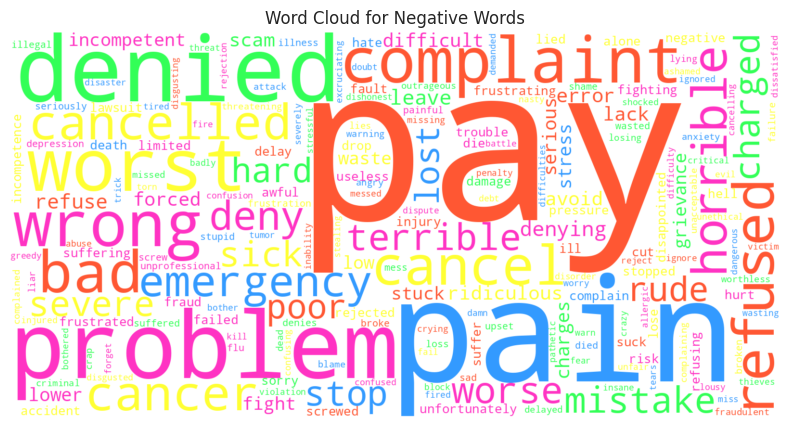

In [19]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap

negative_words = ' '.join(df['Negative'].dropna().apply(str))

colors = ["#FF5733", "#33FF57", "#339AFF", "#FF33C3", "#FFFF33"]
color_map = ListedColormap(colors)

wordcloud = WordCloud(width=1600, height=800, background_color='white', colormap=color_map, collocations=False).generate(negative_words)

plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Word Cloud for Negative Words')
plt.show()


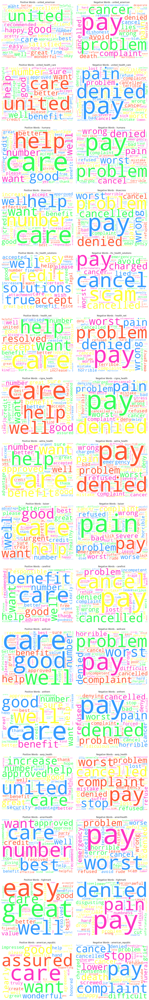

In [20]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap

unique_company_names = df["CompanyName"].unique()

colors = ["#FF5733", "#33FF57", "#339AFF", "#FF33C3", "#FFFF33"]
color_map = ListedColormap(colors)

num_cols = 2
fig, axs = plt.subplots(len(unique_company_names), num_cols, figsize=(12, 5 * len(unique_company_names)))

for i, company_name in enumerate(unique_company_names):
    company_df = df[df["CompanyName"] == company_name]

    positive_words = ' '.join(company_df['Positive'].dropna().apply(str))
    negative_words = ' '.join(company_df['Negative'].dropna().apply(str))

    wordcloud_positive = WordCloud(width=400, height=300, background_color='white', colormap=color_map, collocations=False).generate(positive_words)
    axs[i, 0].imshow(wordcloud_positive, interpolation='bilinear')
    axs[i, 0].set_title(f'Positive Words - {company_name}')
    axs[i, 0].axis('off')

    wordcloud_negative = WordCloud(width=400, height=300, background_color='white', colormap=color_map, collocations=False).generate(negative_words)
    axs[i, 1].imshow(wordcloud_negative, interpolation='bilinear')
    axs[i, 1].set_title(f'Negative Words - {company_name}')
    axs[i, 1].axis('off')

plt.tight_layout()
plt.show()


In [21]:
import nltk

nltk.download('stopwords')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


True

In [23]:
import re
import nltk
from nltk.corpus import stopwords
from bs4 import BeautifulSoup

def clean_text(text):
    text = BeautifulSoup(text, 'lxml').get_text()

    text = re.sub("[^a-zA-Z]", " ", text)

    text = text.lower()

    words = text.split()

    stops = set(stopwords.words("english"))
    words = [word for word in words if not word in stops]

    cleaned_text = " ".join(words)

    return cleaned_text

df['Summary_cleaned'] = df['Summary'].apply(clean_text)

df['Sentiment'] = df['Sentiment'].replace('neutral', 'negative')

df = df[['ID','Summary_cleaned', 'Sentiment', 'Binary_Sentiment']]

df.to_csv('summarized_reviews.csv', index=False)

print(f"{Fore.CYAN}Displaying the cleaned column...{Style.RESET_ALL}")
df[['Summary_cleaned', 'Sentiment', 'Binary_Sentiment']].head(10)


Displaying the cleaned column...


,Summary_cleaned,Sentiment,Binary_Sentiment
0,united american fantastic one bit trouble coll...,positive,1
1,good luck united american got used,positive,1
2,united american insurance policy long time cov...,positive,1
3,cleveland clinic stopped taking hmo united ame...,positive,1
4,husband worked bank life insurance policy reti...,negative,0
5,happy united american insurance great,positive,1
6,lady blacksburg helped insurance signed,negative,0
7,whenever problem call provider california terr...,negative,0
8,satisfied united american payments come bank e...,positive,1
9,far united american good everything gets taken...,positive,1


In [24]:
pip install transformers

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.7/7.7 MB 66.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 295.0/295.0 kB 35.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.8/3.8 MB 106.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 85.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 268.8/268.8 kB 32.5 MB/s eta 0:00:00


In [25]:
# Import necessary libraries
import numpy as np
import pandas as pd
import seaborn as sns
from pylab import rcParams
import matplotlib.pyplot as plt
from matplotlib import rc
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, classification_report
from collections import defaultdict
from textwrap import wrap

# Torch ML libraries
import transformers
from transformers import BertModel, BertTokenizer, AdamW, get_linear_schedule_with_warmup
import torch
from torch import nn, optim
from torch.utils.data import Dataset, DataLoader

# Misc.
import warnings
warnings.filterwarnings('ignore')


In [26]:
# Set intial variables and constants
%config InlineBackend.figure_format='retina'

# Graph Designs
sns.set(style='whitegrid', palette='muted', font_scale=1.2)
HAPPY_COLORS_PALETTE = ["#01BEFE", "#FFDD00", "#FF7D00", "#FF006D", "#ADFF02", "#8F00FF"]
sns.set_palette(sns.color_palette(HAPPY_COLORS_PALETTE))
rcParams['figure.figsize'] = 12, 8

# Random seed for reproducibilty
RANDOM_SEED = 42
np.random.seed(RANDOM_SEED)
torch.manual_seed(RANDOM_SEED)

# Set GPU
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [27]:
df = pd.read_csv('summarized_reviews.csv')
df.shape

(10741, 4)

In [29]:
df.isnull().sum()

ID                  0
Summary_cleaned     0
Sentiment           0
Binary_Sentiment    0
dtype: int64

In [30]:
df['Binary_Sentiment'].value_counts()

0    6918
1    3823
Name: Binary_Sentiment, dtype: int64

In [31]:
from transformers import BertTokenizer, BertForSequenceClassification

# Set the model name
MODEL_NAME = 'bert-base-cased'

# Build a BERT-based tokenizer
tokenizer = BertTokenizer.from_pretrained(MODEL_NAME)

# Initialize the BERT-based model for sequence classification
model = BertForSequenceClassification.from_pretrained(
    MODEL_NAME,
    return_dict=False  # Set return_dict=False here
)

Some weights of BertForSequenceClassification were not initialized from the model checkpoint at bert-base-cased and are newly initialized: ['classifier.weight', 'classifier.bias']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


In [32]:
# Some of the common BERT tokens
print(tokenizer.sep_token, tokenizer.sep_token_id) # marker for ending of a sentence
print(tokenizer.cls_token, tokenizer.cls_token_id) # start of each sentence, so BERT knows we’re doing classification
print(tokenizer.pad_token, tokenizer.pad_token_id) # special token for padding
print(tokenizer.unk_token, tokenizer.unk_token_id) # tokens not found in training set

[SEP] 102
[CLS] 101
[PAD] 0
[UNK] 100


In [33]:
# Store length of each review
token_lens = []

# Iterate through the content slide
for txt in df.Summary_cleaned:
    tokens = tokenizer.encode(txt, max_length=512)
    token_lens.append(len(tokens))

Truncation was not explicitly activated but `max_length` is provided a specific value, please use `truncation=True` to explicitly truncate examples to max length. Defaulting to 'longest_first' truncation strategy. If you encode pairs of sequences (GLUE-style) with the tokenizer you can select this strategy more precisely by providing a specific strategy to `truncation`.


Text(0.5, 0, 'Token count')

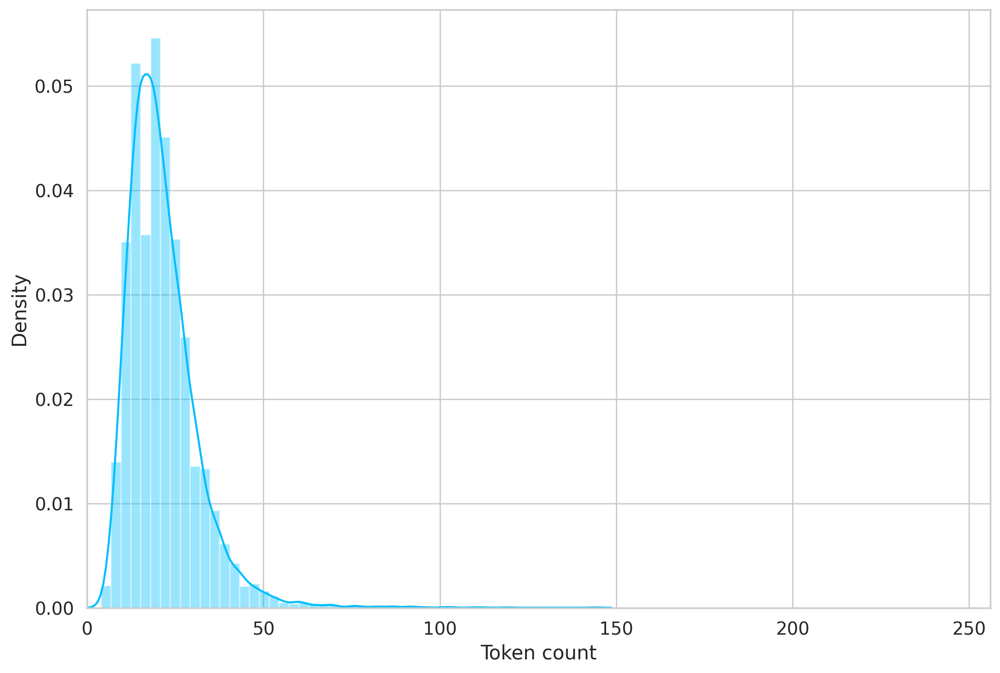

In [34]:
# plot the distribution of review lengths
sns.distplot(token_lens)
plt.xlim([0, 256]);
plt.xlabel('Token count')

In [35]:
max_len = 160

In [36]:
class GPReviewDataset(Dataset):
    # Constructor Function
    def __init__(self, reviews, targets, tokenizer, max_len):
        self.reviews = reviews
        self.targets = targets
        self.tokenizer = tokenizer
        self.max_len = max_len

    # Length magic method
    def __len__(self):
        return len(self.reviews)

    # get item magic method
    def __getitem__(self, item):
        review = str(self.reviews[item])
        target = self.targets[item]

        # Encoded format to be returned
        encoding = self.tokenizer.encode_plus(
            review,
            add_special_tokens=True,
            max_length=self.max_len,
            return_token_type_ids=False,
            pad_to_max_length=True,
            return_attention_mask=True,
            return_tensors='pt',
        )

        return {
            'review_text': review,
            'input_ids': encoding['input_ids'].flatten(),
            'attention_mask': encoding['attention_mask'].flatten(),
            'targets': torch.tensor(target, dtype=torch.long)
        }

In [37]:
df_train, df_test = train_test_split(df, test_size=0.2, random_state=RANDOM_SEED)
df_val, df_test = train_test_split(df_test, test_size=0.5, random_state=RANDOM_SEED)

print(df_train.shape, df_val.shape, df_test.shape)

(8592, 4) (1074, 4) (1075, 4)


In [38]:
def create_data_loader(df, tokenizer, max_len, batch_size):
    ds = GPReviewDataset(
        reviews=df.Summary_cleaned.to_numpy(),
        targets=df.Binary_Sentiment.to_numpy(),
        tokenizer=tokenizer,
        max_len=max_len
    )

    return DataLoader(
        ds,
        batch_size=batch_size,
        num_workers=0
    )

In [39]:
# Create train, test and val data loaders
BATCH_SIZE = 16
train_data_loader = create_data_loader(df_train, tokenizer, max_len, BATCH_SIZE)
val_data_loader = create_data_loader(df_val, tokenizer,max_len, BATCH_SIZE)
test_data_loader = create_data_loader(df_test, tokenizer, max_len, BATCH_SIZE)

In [40]:
# Examples
data = next(iter(train_data_loader))
print(data.keys())

print(data['input_ids'].shape)
print(data['attention_mask'].shape)
print(data['targets'].shape)

dict_keys(['review_text', 'input_ids', 'attention_mask', 'targets'])
torch.Size([16, 160])
torch.Size([16, 160])
torch.Size([16])


In [41]:
# Load the basic BERT model
bert_model = BertModel.from_pretrained(MODEL_NAME, return_dict=False)

In [42]:
# Build the Sentiment Classifier class
class SentimentClassifier(nn.Module):

    # Constructor class
    def __init__(self, n_classes):
        super(SentimentClassifier, self).__init__()
        self.bert = BertModel.from_pretrained(MODEL_NAME)
        self.drop = nn.Dropout(p=0.3)
        self.out = nn.Linear(self.bert.config.hidden_size, n_classes)

    # Forward propagation method
    def forward(self, input_ids, attention_mask):
        output = self.bert(
            input_ids=input_ids,
            attention_mask=attention_mask,
            return_dict=False
        )

        pooled_output = output[1]

        # Add a dropout layer
        output = self.drop(pooled_output)
        return self.out(output)


In [43]:
class_names = ["negative", "positive"]

In [44]:
# Instantiate the model and move to classifier
model = SentimentClassifier(len(class_names))
model = model.to(device)

In [45]:
# Number of hidden units
print(bert_model.config.hidden_size)

768


In [46]:
# Number of iterations
EPOCHS = 10

# Optimizer Adam
optimizer = AdamW(model.parameters(), lr=2e-5, correct_bias=False)

total_steps = len(train_data_loader) * EPOCHS

scheduler = get_linear_schedule_with_warmup(
    optimizer,
    num_warmup_steps=0,
    num_training_steps=total_steps
)

# Set the loss function
loss_fn = nn.CrossEntropyLoss().to(device)

In [47]:
# Function for a single training iteration
def train_epoch(model, data_loader, loss_fn, optimizer, device, scheduler, n_examples):
    model = model.train()
    losses = []
    correct_predictions = 0

    for d in data_loader:
        input_ids = d["input_ids"].to(device)
        attention_mask = d["attention_mask"].to(device)
        targets = d["targets"].to(device)

        outputs = model(
            input_ids=input_ids,
            attention_mask=attention_mask
        )

        _, preds = torch.max(outputs, dim=1)
        loss = loss_fn(outputs, targets)
        correct_predictions += torch.sum(preds == targets)
        losses.append(loss.item())

        # Backward prop
        loss.backward()

        # Gradient Descent
        nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)
        optimizer.step()
        scheduler.step()
        optimizer.zero_grad()

    return correct_predictions.double() / n_examples, np.mean(losses)

In [48]:
def eval_model(model, data_loader, loss_fn, device, n_examples):
    model = model.eval()

    losses = []
    correct_predictions = 0

    with torch.no_grad():
        for d in data_loader:
            input_ids = d["input_ids"].to(device)
            attention_mask = d["attention_mask"].to(device)
            targets = d["targets"].to(device)

            # Get model ouptuts
            outputs = model(
                input_ids=input_ids,
                attention_mask=attention_mask
            )

            _, preds = torch.max(outputs, dim=1)
            loss = loss_fn(outputs, targets)

            correct_predictions += torch.sum(preds == targets)
            losses.append(loss.item())

    return correct_predictions.double() / n_examples, np.mean(losses)

In [49]:
%%time

history = defaultdict(list)
best_accuracy = 0

for epoch in range(EPOCHS):

    # Show details
    print(f"Epoch {epoch + 1}/{EPOCHS}")
    print("-" * 10)

    train_acc, train_loss = train_epoch(
        model,
        train_data_loader,
        loss_fn,
        optimizer,
        device,
        scheduler,
        len(df_train)
    )

    print(f"Train loss {train_loss} accuracy {train_acc}")

    # Get model performance (accuracy and loss)
    val_acc, val_loss = eval_model(
        model,
        val_data_loader,
        loss_fn,
        device,
        len(df_val)
    )

    print(f"Val   loss {val_loss} accuracy {val_acc}")
    print()

    history['train_acc'].append(train_acc)
    history['train_loss'].append(train_loss)
    history['val_acc'].append(val_acc)
    history['val_loss'].append(val_loss)

    # If we beat prev performance
    if val_acc > best_accuracy:
        torch.save(model.state_dict(), 'bert_model_state.bin')
        best_accuracy = val_acc

Epoch 1/10
----------
Train loss 0.4677575592582896 accuracy 0.7912011173184358
Val   loss 0.318785238024943 accuracy 0.8696461824953445

Epoch 2/10
----------
Train loss 0.300529150528143 accuracy 0.8889664804469274
Val   loss 0.2982042077654863 accuracy 0.8938547486033519

Epoch 3/10
----------
Train loss 0.22307095142667577 accuracy 0.9260940409683427
Val   loss 0.32497870252358124 accuracy 0.8975791433891992

Epoch 4/10
----------
Train loss 0.1674189789821628 accuracy 0.9526303538175046
Val   loss 0.4356616715736249 accuracy 0.8938547486033519

Epoch 5/10
----------
Train loss 0.1354575212468225 accuracy 0.9674115456238361
Val   loss 0.4768343871794915 accuracy 0.9003724394785847

Epoch 6/10
----------
Train loss 0.10325075592021883 accuracy 0.9756750465549349
Val   loss 0.5245882949743913 accuracy 0.8947858472998138

Epoch 7/10
----------
Train loss 0.07362149201419804 accuracy 0.9844040968342644
Val   loss 0.582720307414146 accuracy 0.8891992551210428

Epoch 8/10
----------
Trai

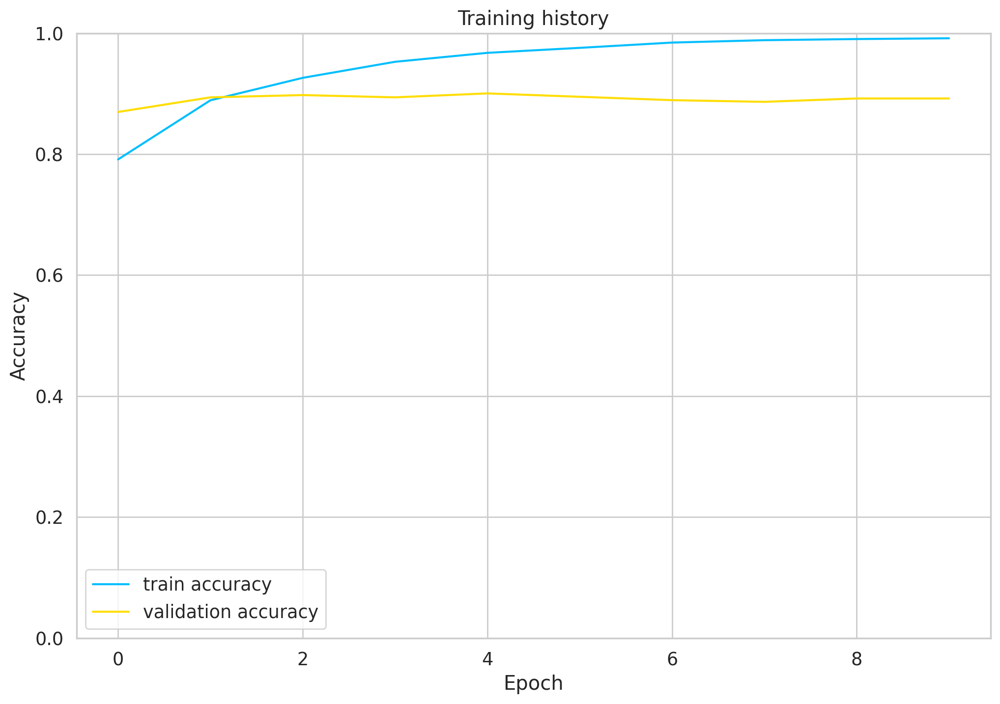

In [50]:
# Move tensors to CPU and then convert to NumPy arrays
train_acc_np = np.array([item.cpu() for item in history['train_acc']])
val_acc_np = np.array([item.cpu() for item in history['val_acc']])

# Plot training and validation accuracy
plt.plot(train_acc_np, label='train accuracy')
plt.plot(val_acc_np, label='validation accuracy')

# Set the y-axis range for accuracy
plt.ylim([0, 1])

# Add labels and legend
plt.title('Training history')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend()
plt.show()


In [51]:
test_acc, _ = eval_model(
  model,
  test_data_loader,
  loss_fn,
  device,
  len(df_test)
)

test_acc.item()

0.8837209302325582

In [52]:
def get_predictions(model, data_loader):
    model = model.eval()

    review_texts = []
    predictions = []
    prediction_probs = []
    real_values = []

    with torch.no_grad():
        for d in data_loader:
            texts = d["review_text"]
            input_ids = d["input_ids"].to(device)
            attention_mask = d["attention_mask"].to(device)
            targets = d["targets"].to(device)

            # Get outouts
            outputs = model(
                input_ids=input_ids,
                attention_mask=attention_mask
            )
            _, preds = torch.max(outputs, dim=1)

            review_texts.extend(texts)
            predictions.extend(preds)
            prediction_probs.extend(outputs)
            real_values.extend(targets)

    predictions = torch.stack(predictions).cpu()
    prediction_probs = torch.stack(prediction_probs).cpu()
    real_values = torch.stack(real_values).cpu()

    return review_texts, predictions, prediction_probs, real_values

In [53]:
y_review_texts, y_pred, y_pred_probs, y_test = get_predictions(
    model,
    test_data_loader
)

In [54]:
print(classification_report(y_test, y_pred, target_names=df['Sentiment'].unique()))

              precision    recall  f1-score   support

    positive       0.90      0.93      0.91       697
    negative       0.85      0.81      0.83       378

    accuracy                           0.88      1075
   macro avg       0.88      0.87      0.87      1075
weighted avg       0.88      0.88      0.88      1075



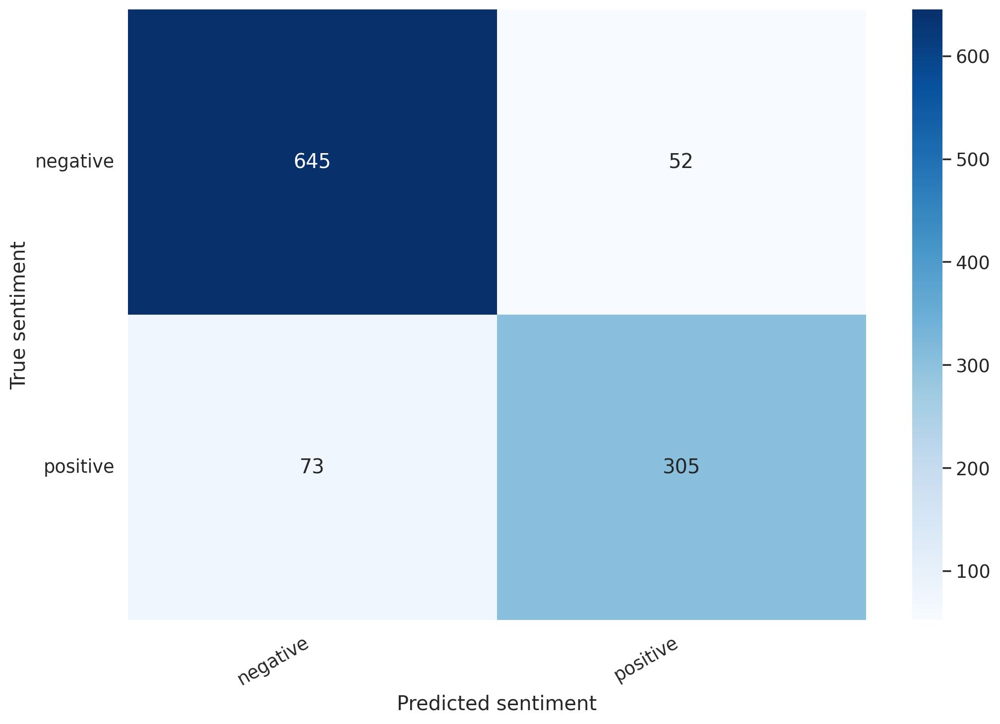

In [55]:
def show_confusion_matrix(confusion_matrix):
    hmap = sns.heatmap(confusion_matrix, annot=True, fmt="d", cmap="Blues")
    hmap.yaxis.set_ticklabels(hmap.yaxis.get_ticklabels(), rotation=0, ha='right')
    hmap.xaxis.set_ticklabels(hmap.xaxis.get_ticklabels(), rotation=30, ha='right')
    plt.ylabel('True sentiment')
    plt.xlabel('Predicted sentiment');

cm = confusion_matrix(y_test, y_pred)
df_cm = pd.DataFrame(cm, index=class_names, columns=class_names)
show_confusion_matrix(df_cm)

In [56]:
review_text = "united american has been fantastic. we have had not one bit of trouble collecting or paying for anything at all."
encoded_review = tokenizer.encode_plus(
    review_text,
    max_length=max_len,
    add_special_tokens=True,
    return_token_type_ids=False,
    pad_to_max_length=True,
    return_attention_mask=True,
    return_tensors='pt',
)

input_ids = encoded_review['input_ids'].to(device)
attention_mask = encoded_review['attention_mask'].to(device)

output = model(input_ids, attention_mask)
_, prediction = torch.max(output, dim=1)

print(f'Review text: {review_text}')
print(f'Sentiment  : {prediction}')

Review text: united american has been fantastic. we have had not one bit of trouble collecting or paying for anything at all.
Sentiment  : tensor([1], device='cuda:0')


In [57]:
def predict_sentiment(text):
    encoded_review = tokenizer.encode_plus(
        text,
        max_length=max_len,
        add_special_tokens=True,
        return_token_type_ids=False,
        pad_to_max_length=True,
        return_attention_mask=True,
        return_tensors='pt',
    )

    input_ids = encoded_review['input_ids'].to(device)
    attention_mask = encoded_review['attention_mask'].to(device)

    output = model(input_ids, attention_mask)
    _, prediction = torch.max(output, dim=1)
    return prediction.item()



In [58]:
df['Bert_Sentiment'] = df['Summary_cleaned'].apply(predict_sentiment)

In [59]:
df

,ID,Summary_cleaned,Sentiment,Binary_Sentiment,Bert_Sentiment
0,1,united american fantastic one bit trouble coll...,positive,1,1
1,2,good luck united american got used,positive,1,1
2,3,united american insurance policy long time cov...,positive,1,1
3,4,cleveland clinic stopped taking hmo united ame...,positive,1,1
4,5,husband worked bank life insurance policy reti...,negative,0,0
...,...,...,...,...,...
10736,10739,abusive unexplained rate increases unexplained...,negative,0,0
10737,10740,despite deductible co insurance american repub...,positive,1,1
10738,10741,complaints company started paying around pr mo...,negative,0,0
10739,10742,insurance sons one lives primarily boca raton ...,positive,1,1


In [60]:
# Save the DataFrame to a new CSV file
df.to_csv('bert_sentiment.csv', index=False)

In [61]:
import torch
import torch.nn as nn
import transformers
from transformers import BertModel, BertTokenizer

# Set the device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Set the model name
MODEL_NAME = 'bert-base-cased'

# Build a BERT based tokenizer
tokenizer = BertTokenizer.from_pretrained(MODEL_NAME)

class_names = ['negative', 'positive']

# Define your model architecture
class SentimentClassifier(nn.Module):

    # Constructor class
    def __init__(self, n_classes):
        super(SentimentClassifier, self).__init__()
        self.bert = BertModel.from_pretrained(MODEL_NAME)
        self.drop = nn.Dropout(p=0.3)
        self.out = nn.Linear(self.bert.config.hidden_size, n_classes)

    # Forward propagation class
    def forward(self, input_ids, attention_mask):
        output = self.bert(
            input_ids=input_ids,
            attention_mask=attention_mask,
            return_dict=False
        )

        _, pooled_output = output
        # Add a dropout layer
        output = self.drop(pooled_output)
        return self.out(output)

# Instantiate the model
model = SentimentClassifier(len(class_names))
model = model.to(device)

# Load the saved state dictionary
model.load_state_dict(torch.load('bert_model_state.bin'))

# Set the model to evaluation mode
model.eval()

review_text = "united american has been fantastic. we have had not one bit of trouble collecting or paying for anything at all."
encoded_review = tokenizer.encode_plus(
    review_text,
    max_length=160,
    add_special_tokens=True,
    return_token_type_ids=False,
    pad_to_max_length=True,
    return_attention_mask=True,
    return_tensors='pt',
    truncation=True
)

input_ids = encoded_review['input_ids'].to(device)
attention_mask = encoded_review['attention_mask'].to(device)

output = model(input_ids, attention_mask)
_, prediction = torch.max(output, dim=1)

print(f'Review text: {review_text}')
print(f'Sentiment  : {class_names[prediction]}')


Review text: united american has been fantastic. we have had not one bit of trouble collecting or paying for anything at all.
Sentiment  : positive


In [62]:
import numpy as np
import pandas as pd
import seaborn as sns
from pylab import rcParams
import matplotlib.pyplot as plt
from matplotlib import rc
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, classification_report
from collections import defaultdict
from textwrap import wrap

# Torch ML libraries
import transformers
from transformers import RobertaModel, RobertaTokenizer, AdamW, get_linear_schedule_with_warmup
import torch
from torch import nn, optim
from torch.utils.data import Dataset, DataLoader

# Misc.
import warnings
warnings.filterwarnings('ignore')

In [63]:
df = pd.read_csv('summarized_reviews.csv')
df.shape

(10741, 4)

In [64]:
from transformers import RobertaTokenizer, RobertaForSequenceClassification

# Set the model name
MODEL_NAME = 'roberta-base'

# Build a RoBERTa-based tokenizer
tokenizer = RobertaTokenizer.from_pretrained(MODEL_NAME)

# Initialize the RoBERTa-based model for sequence classification with return_dict=False
model = RobertaForSequenceClassification.from_pretrained(
    MODEL_NAME,
    return_dict=False
)

Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at roberta-base and are newly initialized: ['classifier.dense.bias', 'classifier.out_proj.weight', 'classifier.dense.weight', 'classifier.out_proj.bias']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


In [65]:
# Some of the common RoBERTa tokens and their token IDs
print("SEP token:", tokenizer.sep_token, tokenizer.sep_token_id)
print("CLS token:", tokenizer.cls_token, tokenizer.cls_token_id)
print("PAD token:", tokenizer.pad_token, tokenizer.pad_token_id)
print("UNK token:", tokenizer.unk_token, tokenizer.unk_token_id)

SEP token: </s> 2
CLS token: <s> 0
PAD token: <pad> 1
UNK token: <unk> 3


In [66]:
# Store length of each review
token_lens = []

# Iterate through the content slide
for txt in df.Summary_cleaned:
    tokens = tokenizer.encode(txt, max_length=512, truncation=True)
    token_lens.append(len(tokens))

In [67]:
from torch.utils.data import Dataset

class GPReviewDataset(Dataset):
    # Constructor Function
    def __init__(self, reviews, targets, tokenizer, max_len):
        self.reviews = reviews
        self.targets = targets
        self.tokenizer = tokenizer
        self.max_len = max_len

    # Length magic method
    def __len__(self):
        return len(self.reviews)

    # get item magic method
    def __getitem__(self, item):
        review = str(self.reviews[item])
        target = self.targets[item]

        # Encoded format to be returned
        encoding = self.tokenizer.encode_plus(
            review,
            add_special_tokens=True,
            max_length=self.max_len,
            truncation=True,  # Add truncation=True to handle long sequences
            padding='max_length',  # Change 'pad_to_max_length' to 'padding'
            return_attention_mask=True,
            return_tensors='pt',
        )

        return {
            'review_text': review,
            'input_ids': encoding['input_ids'].flatten(),
            'attention_mask': encoding['attention_mask'].flatten(),
            'targets': torch.tensor(target, dtype=torch.long)
        }


In [68]:
# Split the DataFrame into training, validation, and test sets
df_train, df_test = train_test_split(df, test_size=0.2, random_state=RANDOM_SEED)
df_val, df_test = train_test_split(df_test, test_size=0.5, random_state=RANDOM_SEED)

# Print the shapes of the resulting sets
print(df_train.shape, df_val.shape, df_test.shape)

(8592, 4) (1074, 4) (1075, 4)


In [69]:
from torch.utils.data import DataLoader

def create_data_loader(df, tokenizer, max_len, batch_size):
    ds = GPReviewDataset(
        reviews=df.Summary_cleaned.to_numpy(),
        targets=df.Binary_Sentiment.to_numpy(),
        tokenizer=tokenizer,
        max_len=max_len
    )

    return DataLoader(
        ds,
        batch_size=batch_size,
        num_workers=0
    )

In [70]:
# Define batch size
BATCH_SIZE = 16

# Create train, validation, and test data loaders
train_data_loader = create_data_loader(df_train, tokenizer, max_len, BATCH_SIZE)
val_data_loader = create_data_loader(df_val, tokenizer, max_len, BATCH_SIZE)
test_data_loader = create_data_loader(df_test, tokenizer, max_len, BATCH_SIZE)

In [71]:
# Get a batch of data from the training data loader
data = next(iter(train_data_loader))

# Print the keys of the batch
print(data.keys())

# Print the shapes of input_ids, attention_mask, and targets tensors
print(data['input_ids'].shape)
print(data['attention_mask'].shape)
print(data['targets'].shape)

dict_keys(['review_text', 'input_ids', 'attention_mask', 'targets'])
torch.Size([16, 160])
torch.Size([16, 160])
torch.Size([16])


In [72]:
from transformers import RobertaModel

# Load the RoBERTa model
roberta_model = RobertaModel.from_pretrained(MODEL_NAME, return_dict=False)

Some weights of RobertaModel were not initialized from the model checkpoint at roberta-base and are newly initialized: ['roberta.pooler.dense.weight', 'roberta.pooler.dense.bias']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


In [73]:
# Assuming MODEL_NAME is the name of the RoBERTa model
MODEL_NAME = 'roberta-base'

class SentimentClassifier(nn.Module):
    def __init__(self, n_classes):
        super(SentimentClassifier, self).__init__()
        self.roberta = RobertaModel.from_pretrained(MODEL_NAME)
        self.drop = nn.Dropout(p=0.3)
        self.out = nn.Linear(self.roberta.config.hidden_size, n_classes)

    def forward(self, input_ids, attention_mask):
        output = self.roberta(
            input_ids=input_ids,
            attention_mask=attention_mask,
            return_dict=False
        )

        pooled_output = output[0][:, 0, :]

        output = self.drop(pooled_output)
        return self.out(output)


In [74]:
# Instantiate the model and move to classifier
model = SentimentClassifier(len(class_names))
model = model.to(device)

Some weights of RobertaModel were not initialized from the model checkpoint at roberta-base and are newly initialized: ['roberta.pooler.dense.weight', 'roberta.pooler.dense.bias']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


In [75]:
# Assuming you have already loaded your RoBERTa model and named it 'model'
hidden_size = model.roberta.config.hidden_size
print(hidden_size)

768


In [76]:
# Number of iterations (EPOCHS) and other configurations
EPOCHS = 10

# Optimizer (Adam) with a specific learning rate and other options
optimizer = AdamW(model.parameters(), lr=2e-5, correct_bias=False)

# Calculate the total number of training steps
total_steps = len(train_data_loader) * EPOCHS

# Learning rate scheduler with warm-up
scheduler = get_linear_schedule_with_warmup(
    optimizer,
    num_warmup_steps=0,
    num_training_steps=total_steps
)

# Loss function (CrossEntropyLoss)
loss_fn = nn.CrossEntropyLoss().to(device)

In [77]:
def train_epoch(model, data_loader, loss_fn, optimizer, device, scheduler, n_examples):
    model = model.train()
    losses = []
    correct_predictions = 0

    for d in data_loader:
        input_ids = d["input_ids"].to(device)
        attention_mask = d["attention_mask"].to(device)
        targets = d["targets"].to(device)

        outputs = model(
            input_ids=input_ids,
            attention_mask=attention_mask
        )

        _, preds = torch.max(outputs, dim=1)
        loss = loss_fn(outputs, targets)
        correct_predictions += torch.sum(preds == targets)
        losses.append(loss.item())

        # Backward prop
        loss.backward()

        # Gradient Descent
        nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)
        optimizer.step()
        scheduler.step()
        optimizer.zero_grad()

    return correct_predictions.double() / n_examples, np.mean(losses)


In [78]:
def eval_model(model, data_loader, loss_fn, device, n_examples):
    model = model.eval()

    losses = []
    correct_predictions = 0

    with torch.no_grad():
        for d in data_loader:
            input_ids = d["input_ids"].to(device)
            attention_mask = d["attention_mask"].to(device)
            targets = d["targets"].to(device)

            # Get model outputs
            outputs = model(
                input_ids=input_ids,
                attention_mask=attention_mask
            )

            _, preds = torch.max(outputs, dim=1)
            loss = loss_fn(outputs, targets)

            correct_predictions += torch.sum(preds == targets)
            losses.append(loss.item())

    return correct_predictions.double() / n_examples, np.mean(losses)

In [79]:
%%time

history = defaultdict(list)
best_accuracy = 0

for epoch in range(EPOCHS):

    # Show details
    print(f"Epoch {epoch + 1}/{EPOCHS}")
    print("-" * 10)

    train_acc, train_loss = train_epoch(
        model,
        train_data_loader,
        loss_fn,
        optimizer,
        device,
        scheduler,
        len(df_train)
    )

    print(f"Train loss {train_loss} accuracy {train_acc}")

    # Get model performance (accuracy and loss)
    val_acc, val_loss = eval_model(
        model,
        val_data_loader,
        loss_fn,
        device,
        len(df_val)
    )

    print(f"Val   loss {val_loss} accuracy {val_acc}")
    print()

    history['train_acc'].append(train_acc)
    history['train_loss'].append(train_loss)
    history['val_acc'].append(val_acc)
    history['val_loss'].append(val_loss)

    # If we beat prev performance
    if val_acc > best_accuracy:
        torch.save(model.state_dict(), 'roberta_model_state.bin')
        best_accuracy = val_acc

Epoch 1/10
----------
Train loss 0.56945115380558 accuracy 0.7339385474860335
Val   loss 0.43948303491753693 accuracy 0.8333333333333334

Epoch 2/10
----------
Train loss 0.47809453441777044 accuracy 0.813780260707635
Val   loss 0.4381550317082335 accuracy 0.8361266294227188

Epoch 3/10
----------
Train loss 0.40463774452884327 accuracy 0.8414804469273743
Val   loss 0.411596966907382 accuracy 0.845437616387337

Epoch 4/10
----------
Train loss 0.35488823808910014 accuracy 0.8691806331471136
Val   loss 0.37387419746750417 accuracy 0.8696461824953445

Epoch 5/10
----------
Train loss 0.3114996273174632 accuracy 0.8874534450651769
Val   loss 0.41818353657008095 accuracy 0.8724394785847299

Epoch 6/10
----------
Train loss 0.28078755912903414 accuracy 0.9039804469273743
Val   loss 0.4216126230380991 accuracy 0.8687150837988826

Epoch 7/10
----------
Train loss 0.24625298852583105 accuracy 0.9213221601489758
Val   loss 0.48303232755621567 accuracy 0.8724394785847299

Epoch 8/10
----------
T

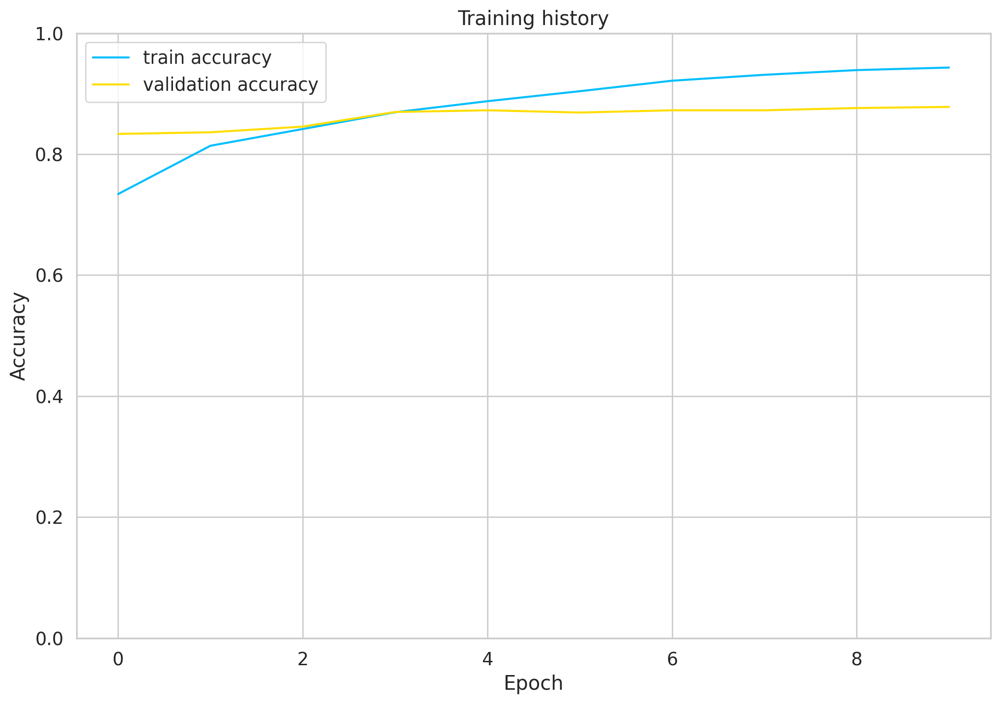

In [80]:
# Move tensors to CPU and then convert to NumPy arrays
train_acc_np = np.array([item.cpu() for item in history['train_acc']])
val_acc_np = np.array([item.cpu() for item in history['val_acc']])

# Plot training and validation accuracy
plt.plot(train_acc_np, label='train accuracy')
plt.plot(val_acc_np, label='validation accuracy')

# Set the y-axis range for accuracy
plt.ylim([0, 1])

# Add labels and legend
plt.title('Training history')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend()
plt.show()

In [81]:
test_acc, _ = eval_model(
  model,
  test_data_loader,
  loss_fn,
  device,
  len(df_test)
)

test_acc.item()

0.876279069767442

In [82]:
def get_predictions(model, data_loader):
    model = model.eval()

    review_texts = []
    predictions = []
    prediction_probs = []
    real_values = []

    with torch.no_grad():
        for d in data_loader:
            texts = d["review_text"]
            input_ids = d["input_ids"].to(device)
            attention_mask = d["attention_mask"].to(device)
            targets = d["targets"].to(device)

            # Get outouts
            outputs = model(
                input_ids=input_ids,
                attention_mask=attention_mask
            )
            _, preds = torch.max(outputs, dim=1)

            review_texts.extend(texts)
            predictions.extend(preds)
            prediction_probs.extend(outputs)
            real_values.extend(targets)

    predictions = torch.stack(predictions).cpu()
    prediction_probs = torch.stack(prediction_probs).cpu()
    real_values = torch.stack(real_values).cpu()

    return review_texts, predictions, prediction_probs, real_values

In [83]:
y_review_texts, y_pred, y_pred_probs, y_test = get_predictions(
    model,
    test_data_loader
)

In [84]:
print(classification_report(y_test, y_pred, target_names=df['Sentiment'].unique()))

              precision    recall  f1-score   support

    positive       0.90      0.91      0.91       697
    negative       0.83      0.81      0.82       378

    accuracy                           0.88      1075
   macro avg       0.87      0.86      0.86      1075
weighted avg       0.88      0.88      0.88      1075



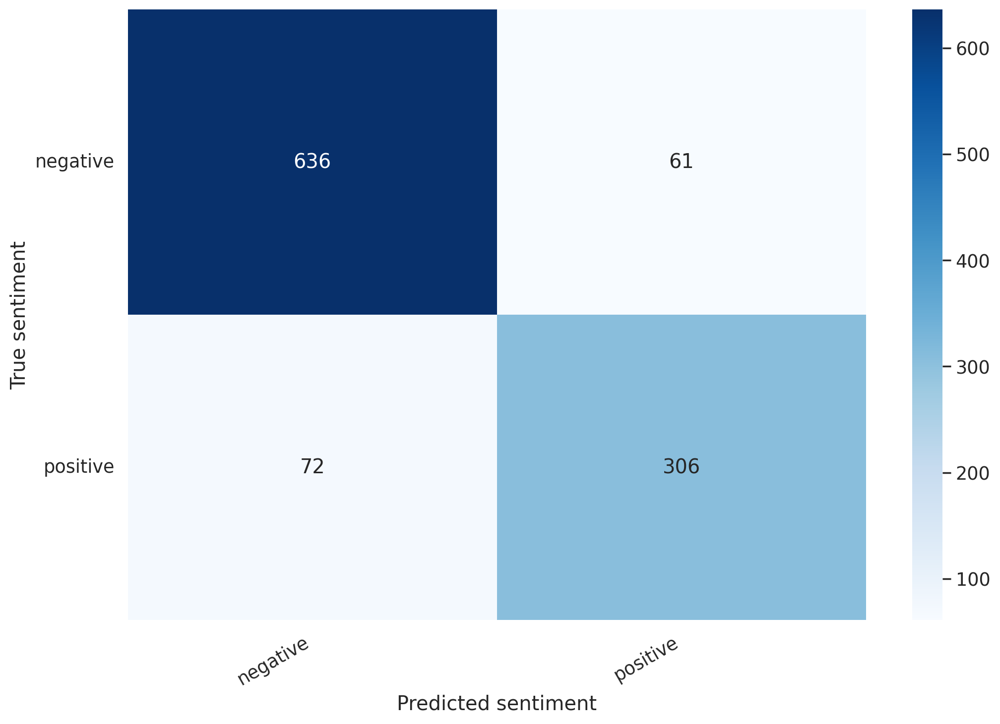

In [85]:
def show_confusion_matrix(confusion_matrix):
    hmap = sns.heatmap(confusion_matrix, annot=True, fmt="d", cmap="Blues")
    hmap.yaxis.set_ticklabels(hmap.yaxis.get_ticklabels(), rotation=0, ha='right')
    hmap.xaxis.set_ticklabels(hmap.xaxis.get_ticklabels(), rotation=30, ha='right')
    plt.ylabel('True sentiment')
    plt.xlabel('Predicted sentiment');

cm = confusion_matrix(y_test, y_pred)
df_cm = pd.DataFrame(cm, index=class_names, columns=class_names)
show_confusion_matrix(df_cm)

In [86]:
review_text = "united american has been fantastic. we have had not one bit of trouble collecting or paying for anything at all."

# Tokenize the review text
encoded_review = tokenizer.encode_plus(
    review_text,
    max_length=max_len,  # Specify your desired max length
    add_special_tokens=True,
    return_token_type_ids=False,
    pad_to_max_length=True,
    return_attention_mask=True,
    return_tensors='pt',
    truncation=True
)

input_ids = encoded_review['input_ids'].to(device)
attention_mask = encoded_review['attention_mask'].to(device)

# Use your RoBERTa-based model for prediction
output = model(input_ids, attention_mask)
_, prediction = torch.max(output, dim=1)

# Print the results
print(f'Review text: {review_text}')
print(f'Sentiment  : {prediction.item()}')

Review text: united american has been fantastic. we have had not one bit of trouble collecting or paying for anything at all.
Sentiment  : 1


In [87]:
# Create an empty list to store predicted sentiments
predicted_sentiments = []

# Iterate through the rows of the DataFrame and predict sentiment
for text in df['Summary_cleaned']:
    sentiment = predict_sentiment(text)
    predicted_sentiments.append(sentiment)

# Add the predicted sentiments to the DataFrame
df['RoBERTa_Sentiment'] = predicted_sentiments

# Save the DataFrame to a new CSV file
df.to_csv('sentiment_predictions.csv', index=False)

Truncation was not explicitly activated but `max_length` is provided a specific value, please use `truncation=True` to explicitly truncate examples to max length. Defaulting to 'longest_first' truncation strategy. If you encode pairs of sequences (GLUE-style) with the tokenizer you can select this strategy more precisely by providing a specific strategy to `truncation`.


In [88]:
df['RoberTa_Sentiment'] = df['Summary_cleaned'].apply(predict_sentiment)

In [89]:
df

,ID,Summary_cleaned,Sentiment,Binary_Sentiment,RoBERTa_Sentiment,RoberTa_Sentiment
0,1,united american fantastic one bit trouble coll...,positive,1,1,1
1,2,good luck united american got used,positive,1,1,1
2,3,united american insurance policy long time cov...,positive,1,1,1
3,4,cleveland clinic stopped taking hmo united ame...,positive,1,1,1
4,5,husband worked bank life insurance policy reti...,negative,0,0,0
...,...,...,...,...,...,...
10736,10739,abusive unexplained rate increases unexplained...,negative,0,1,1
10737,10740,despite deductible co insurance american repub...,positive,1,1,1
10738,10741,complaints company started paying around pr mo...,negative,0,0,0
10739,10742,insurance sons one lives primarily boca raton ...,positive,1,1,1


In [90]:
# Save the DataFrame to a new CSV file
df.to_csv('roberta_sentiment.csv', index=False)

In [91]:
import torch
import torch.nn as nn
from transformers import RobertaModel, RobertaTokenizer

# Set the device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Set the model name
MODEL_NAME = 'roberta-base'

# Build a RoBERTa-based tokenizer
tokenizer = RobertaTokenizer.from_pretrained(MODEL_NAME)

class_names = ['negative', 'positive']

# Define your model architecture
class SentimentClassifier(nn.Module):

    # Constructor class
    def __init__(self, n_classes):
        super(SentimentClassifier, self).__init__()
        self.roberta = RobertaModel.from_pretrained(MODEL_NAME)
        self.drop = nn.Dropout(p=0.3)
        self.out = nn.Linear(self.roberta.config.hidden_size, n_classes)

    # Forward propagation class
    def forward(self, input_ids, attention_mask):
        output = self.roberta(
            input_ids=input_ids,
            attention_mask=attention_mask,
            return_dict=False  # Include return_dict=False here
        )

        pooled_output = output[1]
        # Add a dropout layer
        output = self.drop(pooled_output)
        return self.out(output)

# Instantiate the model
model = SentimentClassifier(len(class_names))
model = model.to(device)

# Load the saved state dictionary
model.load_state_dict(torch.load('roberta_model_state.bin'))

# Set the model to evaluation mode
model.eval()

review_text = "united american has been fantastic. we have had not one bit of trouble collecting or paying for anything at all."
encoded_review = tokenizer.encode_plus(
    review_text,
    max_length=160,
    add_special_tokens=True,
    return_token_type_ids=False,
    pad_to_max_length=True,
    return_attention_mask=True,
    return_tensors='pt',
    truncation=True
)

input_ids = encoded_review['input_ids'].to(device)
attention_mask = encoded_review['attention_mask'].to(device)

output = model(input_ids, attention_mask)
_, prediction = torch.max(output, dim=1)

print(f'Review text: {review_text}')
print(f'Sentiment  : {class_names[prediction]}')

Some weights of RobertaModel were not initialized from the model checkpoint at roberta-base and are newly initialized: ['roberta.pooler.dense.weight', 'roberta.pooler.dense.bias']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Review text: united american has been fantastic. we have had not one bit of trouble collecting or paying for anything at all.
Sentiment  : negative


In [92]:
import pandas as pd

reviews_dataset_path = "/content/drive/MyDrive/reviews.csv"

reviews_df = pd.read_csv(reviews_dataset_path)

selected_columns = reviews_df[['ID','CompanyName', 'Date', 'OwnershipType']]

selected_columns.to_csv('analysis.csv', index=False)


In [93]:
roberta_sentiment_dataset_path = "roberta_sentiment.csv"
roberta_sentiment_df = pd.read_csv(roberta_sentiment_dataset_path)

selected_roberta_columns = roberta_sentiment_df[['Summary_cleaned', 'Sentiment', 'Binary_Sentiment', 'RoBERTa_Sentiment']]

result_df = pd.concat([selected_columns, selected_roberta_columns], axis=1)

result_df.to_csv('analysis.csv', index=False)


In [94]:
df = pd.read_csv("analysis.csv")

print(len(df))
df

10743


,ID,CompanyName,Date,OwnershipType,Summary_cleaned,Sentiment,Binary_Sentiment,RoBERTa_Sentiment
0,1,united_american,4/22/2023,Public,united american fantastic one bit trouble coll...,positive,1.0,1.0
1,2,united_american,10/28/2022,Public,good luck united american got used,positive,1.0,1.0
2,3,united_american,10/12/2022,Public,united american insurance policy long time cov...,positive,1.0,1.0
3,4,united_american,09/01/2022,Public,cleveland clinic stopped taking hmo united ame...,positive,1.0,1.0
4,5,united_american,5/30/2022,Public,husband worked bank life insurance policy reti...,negative,0.0,0.0
...,...,...,...,...,...,...,...,...
10738,10739,american_republic,08/01/2006,Private,complaints company started paying around pr mo...,negative,0.0,0.0
10739,10740,american_republic,1/29/2006,Private,insurance sons one lives primarily boca raton ...,positive,1.0,1.0
10740,10741,american_republic,8/26/2005,Private,first reason cancelled company health insuranc...,negative,0.0,0.0
10741,10742,american_republic,08/02/2005,Private,NaN,NaN,NaN,NaN


In [95]:
import pandas as pd

analysis_dataset_path = "analysis.csv"
analysis_df = pd.read_csv(analysis_dataset_path)

analysis_df.rename(columns={"Binary_Sentiment": "Initial_Sentiment"}, inplace=True)

analysis_df.to_csv('analysis.csv', index=False)


In [96]:
import pandas as pd

analysis_dataset_path = "analysis.csv"
analysis_df = pd.read_csv(analysis_dataset_path)

bert_sentiment_dataset_path = "bert_sentiment.csv"
bert_sentiment_df = pd.read_csv(bert_sentiment_dataset_path)

bert_sentiment_column = bert_sentiment_df['Bert_Sentiment']

analysis_df['Bert_Sentiment'] = bert_sentiment_column

analysis_df.to_csv('analysis.csv', index=False)


In [97]:
df = pd.read_csv("analysis.csv")

print(len(df))
df

10743


,ID,CompanyName,Date,OwnershipType,Summary_cleaned,Sentiment,Initial_Sentiment,RoBERTa_Sentiment,Bert_Sentiment
0,1,united_american,4/22/2023,Public,united american fantastic one bit trouble coll...,positive,1.0,1.0,1.0
1,2,united_american,10/28/2022,Public,good luck united american got used,positive,1.0,1.0,1.0
2,3,united_american,10/12/2022,Public,united american insurance policy long time cov...,positive,1.0,1.0,1.0
3,4,united_american,09/01/2022,Public,cleveland clinic stopped taking hmo united ame...,positive,1.0,1.0,1.0
4,5,united_american,5/30/2022,Public,husband worked bank life insurance policy reti...,negative,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...
10738,10739,american_republic,08/01/2006,Private,complaints company started paying around pr mo...,negative,0.0,0.0,0.0
10739,10740,american_republic,1/29/2006,Private,insurance sons one lives primarily boca raton ...,positive,1.0,1.0,1.0
10740,10741,american_republic,8/26/2005,Private,first reason cancelled company health insuranc...,negative,0.0,0.0,0.0
10741,10742,american_republic,08/02/2005,Private,NaN,NaN,NaN,NaN,NaN


In [98]:
import pandas as pd

analysis_dataset_path = "analysis.csv"
analysis_df = pd.read_csv(analysis_dataset_path)

analysis_df = analysis_df.dropna()

analysis_df.to_csv('analysis.csv', index=False)

In [100]:
import pandas as pd

analysis_dataset_path = "analysis.csv"
analysis_df = pd.read_csv(analysis_dataset_path)

columns_to_convert = ["Initial_Sentiment", "RoBERTa_Sentiment", "Bert_Sentiment"]
analysis_df[columns_to_convert] = analysis_df[columns_to_convert].astype(int)

analysis_df.to_csv('analysis.csv', index=False)


In [101]:
df = pd.read_csv("analysis.csv")

print(len(df))
df

10741


,ID,CompanyName,Date,OwnershipType,Summary_cleaned,Sentiment,Initial_Sentiment,RoBERTa_Sentiment,Bert_Sentiment
0,1,united_american,4/22/2023,Public,united american fantastic one bit trouble coll...,positive,1,1,1
1,2,united_american,10/28/2022,Public,good luck united american got used,positive,1,1,1
2,3,united_american,10/12/2022,Public,united american insurance policy long time cov...,positive,1,1,1
3,4,united_american,09/01/2022,Public,cleveland clinic stopped taking hmo united ame...,positive,1,1,1
4,5,united_american,5/30/2022,Public,husband worked bank life insurance policy reti...,negative,0,0,0
...,...,...,...,...,...,...,...,...,...
10736,10737,american_republic,1/23/2008,Private,abusive unexplained rate increases unexplained...,negative,0,1,0
10737,10738,american_republic,1/17/2008,Private,despite deductible co insurance american repub...,positive,1,1,1
10738,10739,american_republic,08/01/2006,Private,complaints company started paying around pr mo...,negative,0,0,0
10739,10740,american_republic,1/29/2006,Private,insurance sons one lives primarily boca raton ...,positive,1,1,1


In [103]:
import pandas as pd


df['Date'] = pd.to_datetime(df['Date'])

df.head(10)


,ID,CompanyName,Date,OwnershipType,Summary_cleaned,Sentiment,Initial_Sentiment,RoBERTa_Sentiment,Bert_Sentiment
0,1,united_american,2023-04-22,Public,united american fantastic one bit trouble coll...,positive,1,1,1
1,2,united_american,2022-10-28,Public,good luck united american got used,positive,1,1,1
2,3,united_american,2022-10-12,Public,united american insurance policy long time cov...,positive,1,1,1
3,4,united_american,2022-09-01,Public,cleveland clinic stopped taking hmo united ame...,positive,1,1,1
4,5,united_american,2022-05-30,Public,husband worked bank life insurance policy reti...,negative,0,0,0
5,6,united_american,2023-04-23,Public,happy united american insurance great,positive,1,1,1
6,7,united_american,2023-04-21,Public,lady blacksburg helped insurance signed,negative,0,0,0
7,8,united_american,2023-04-11,Public,whenever problem call provider california terr...,negative,0,1,0
8,9,united_american,2023-03-30,Public,satisfied united american payments come bank e...,positive,1,1,1
9,10,united_american,2023-03-29,Public,far united american good everything gets taken...,positive,1,1,1


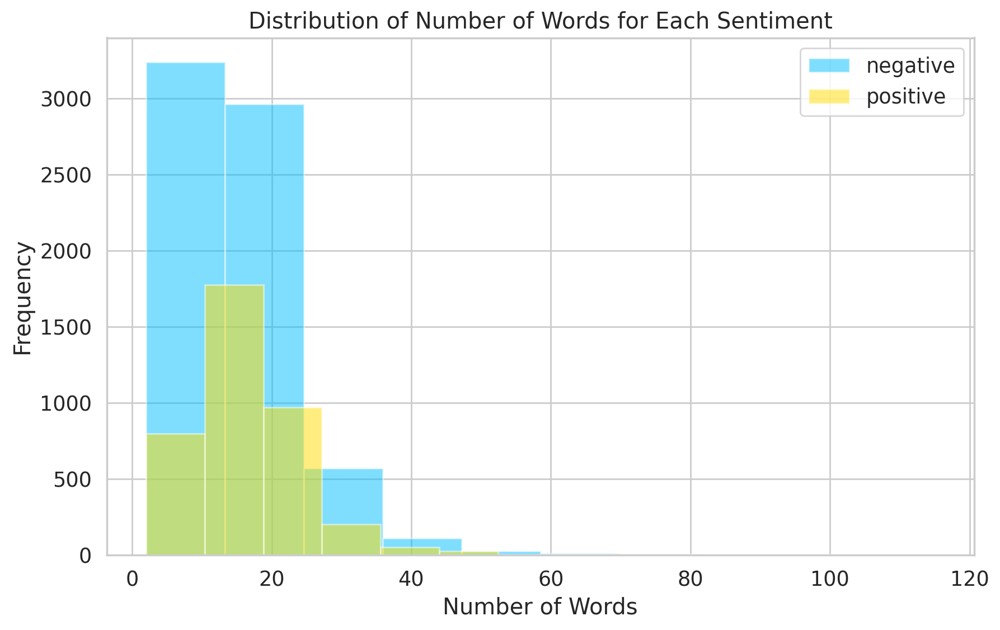

In [104]:
import pandas as pd
import matplotlib.pyplot as plt

df['Word_Count'] = df['Summary_cleaned'].apply(lambda x: len(x.split()))

sentiment_groups = df.groupby('Sentiment')

plt.figure(figsize=(10, 6))
for sentiment, group in sentiment_groups:
    plt.hist(group['Word_Count'], bins=10, alpha=0.5, label=sentiment)

plt.xlabel('Number of Words')
plt.ylabel('Frequency')
plt.title('Distribution of Number of Words for Each Sentiment')
plt.legend()
plt.grid(True)
plt.show()


In [106]:
import nltk

# Specify the download directory explicitly
nltk.data.path.append("nltk_data")  # Replace with the actual path to your nltk_data directory

# Download the 'punkt' tokenizer data
nltk.download('punkt')


[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.


True

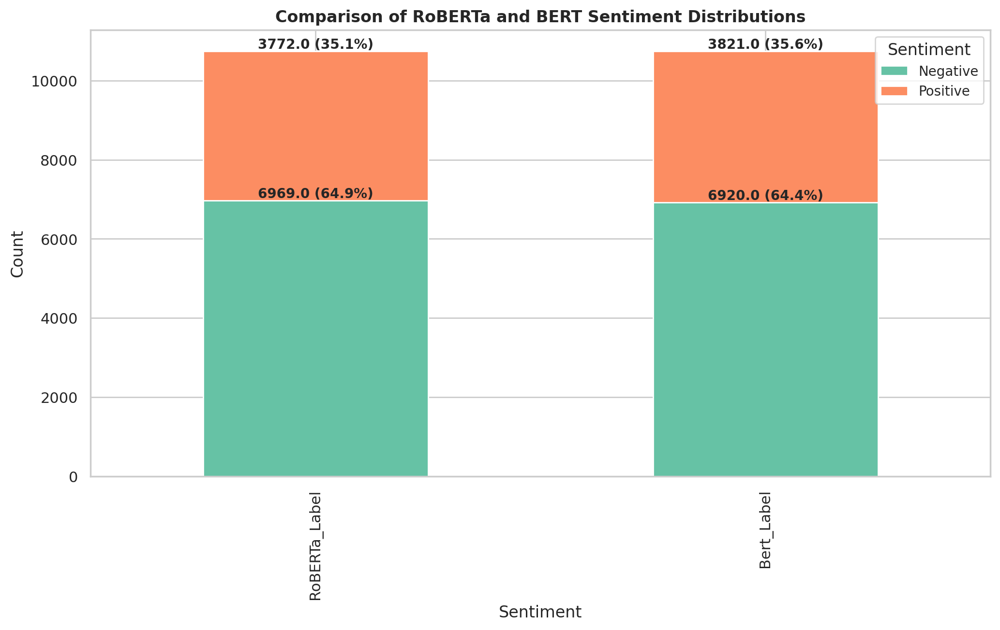

In [107]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

analysis_dataset_path = "analysis.csv"
analysis_df = pd.read_csv(analysis_dataset_path)

analysis_df['RoBERTa_Label'] = analysis_df['RoBERTa_Sentiment'].map({0: 'Negative', 1: 'Positive'})
analysis_df['Bert_Label'] = analysis_df['Bert_Sentiment'].map({0: 'Negative', 1: 'Positive'})

# Create a DataFrame with only RoBERTa and Bert sentiments
sentiment_counts = analysis_df[['RoBERTa_Label', 'Bert_Label']].apply(pd.Series.value_counts).T

sns.set(style="whitegrid")
colors = sns.color_palette("Set2")

ax = sentiment_counts.plot(kind='bar', stacked=True, figsize=(12, 6), color=colors)
ax.set_xlabel('Sentiment')
ax.set_ylabel('Count')
ax.set_title('Comparison of RoBERTa and BERT Sentiment Distributions', fontweight='bold')

total = sentiment_counts.sum(axis=1)
for container in ax.containers:
    ax.bar_label(container, labels=[f'{val} ({val/total[i]*100:.1f}%)' for val, i in zip(container.datavalues, range(len(total)))], label_type='edge', fontsize=10, fontweight='bold')

plt.legend(title='Sentiment', title_fontsize='12', fontsize='10', loc='upper right')
plt.show()

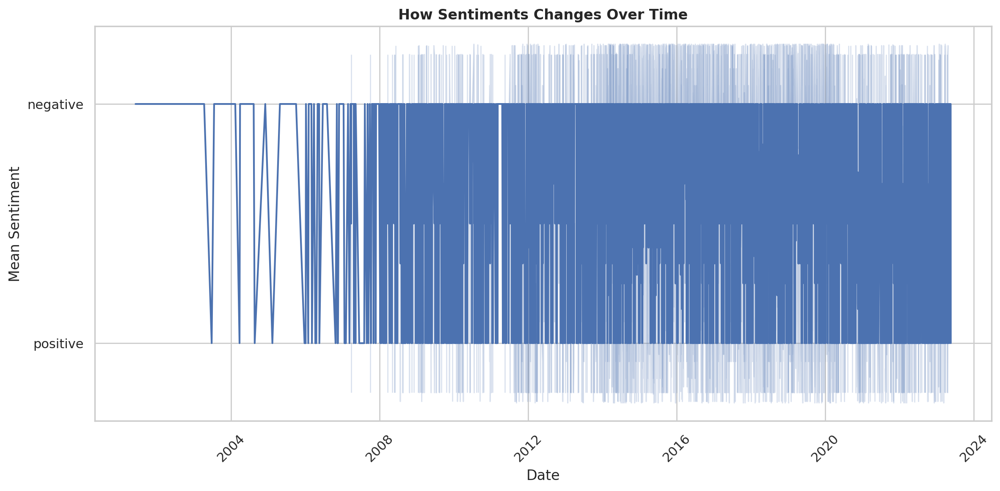

In [108]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from datetime import datetime

analysis_dataset_path = "analysis.csv"
analysis_df = pd.read_csv(analysis_dataset_path)

analysis_df['Date'] = pd.to_datetime(analysis_df['Date'])

analysis_df.sort_values(by='Date', inplace=True)

sns.set(style="whitegrid")

plt.figure(figsize=(12, 6))
sns.lineplot(data=analysis_df, x='Date', y='Sentiment', estimator='mean', ci='sd')
plt.xlabel('Date')
plt.ylabel('Mean Sentiment')
plt.title('How Sentiments Changes Over Time', fontweight='bold')

plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


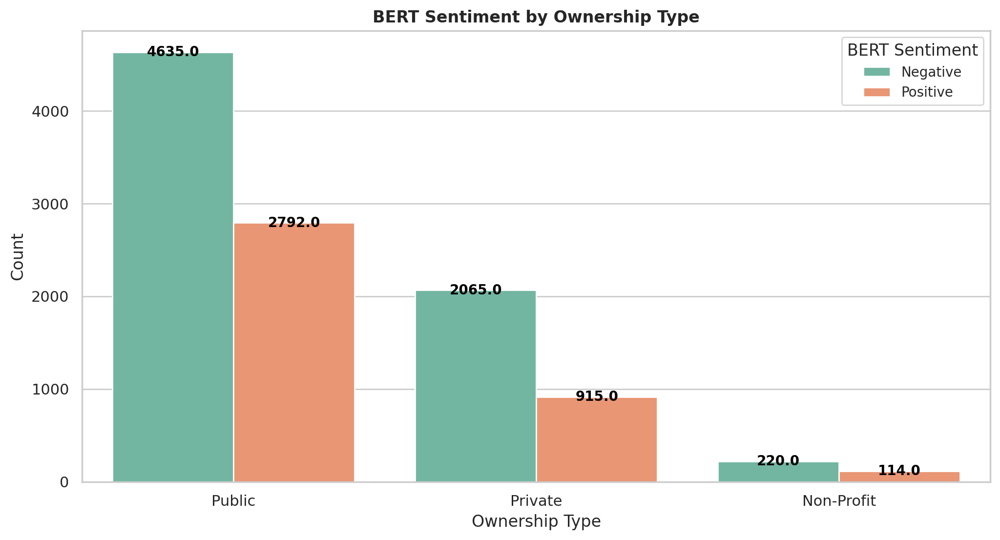

In [109]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Create a countplot with numeric values
plt.figure(figsize=(12, 6))
sns.set(style="whitegrid")
colors = sns.color_palette("Set2")

ax = sns.countplot(data=df, x='OwnershipType', hue='Bert_Sentiment', palette=colors)

ax.set_xlabel('Ownership Type')
ax.set_ylabel('Count')
ax.set_title('BERT Sentiment by Ownership Type', fontweight='bold')

# Add numeric values on top of the bars
for p in ax.patches:
    ax.annotate(f'{p.get_height()}', (p.get_x() + p.get_width() / 2., p.get_height()), ha='center', va='center', fontsize=10, color='black', fontweight='bold')

plt.legend(title='BERT Sentiment', title_fontsize='12', fontsize='10', loc='upper right', labels=['Negative', 'Positive'])
plt.show()


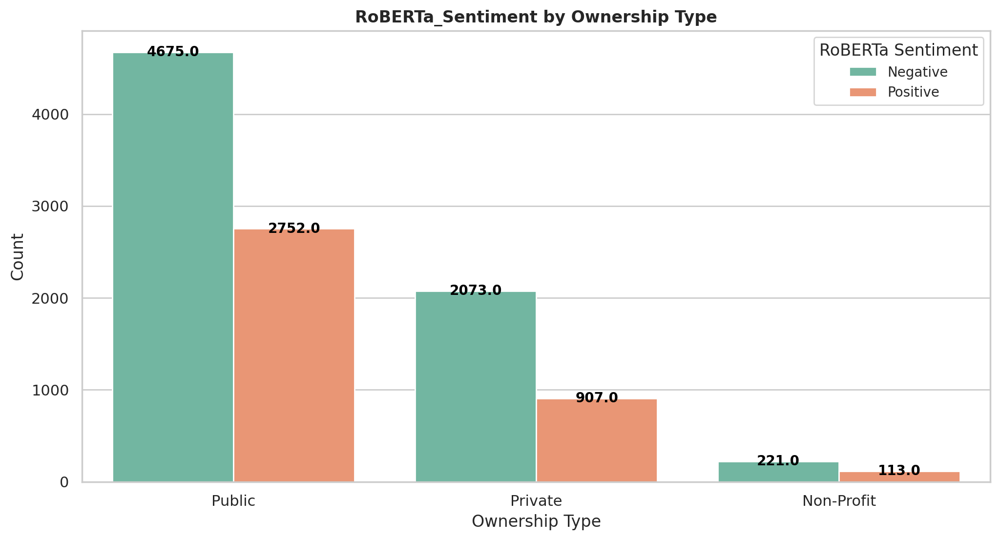

In [110]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Create a countplot with numeric values
plt.figure(figsize=(12, 6))
sns.set(style="whitegrid")
colors = sns.color_palette("Set2")

ax = sns.countplot(data=df, x='OwnershipType', hue='RoBERTa_Sentiment', palette=colors)

ax.set_xlabel('Ownership Type')
ax.set_ylabel('Count')
ax.set_title('RoBERTa_Sentiment by Ownership Type', fontweight='bold')

# Add numeric values on top of the bars
for p in ax.patches:
    ax.annotate(f'{p.get_height()}', (p.get_x() + p.get_width() / 2., p.get_height()), ha='center', va='center', fontsize=10, color='black', fontweight='bold')

plt.legend(title='RoBERTa Sentiment', title_fontsize='12', fontsize='10', loc='upper right', labels=['Negative', 'Positive'])
plt.show()


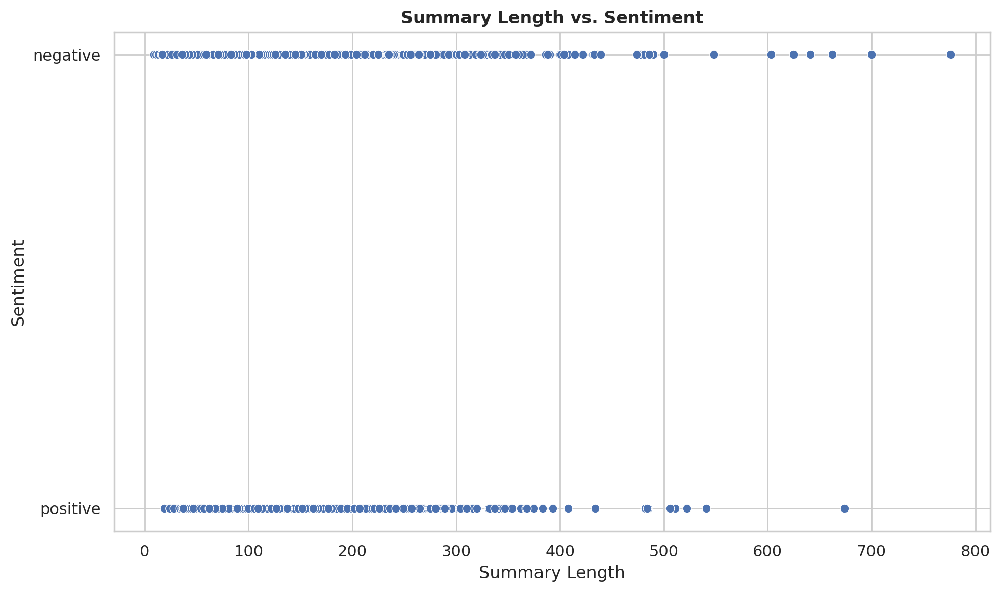

In [111]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Check and clean the 'Summary_cleaned' column
analysis_df['Summary_cleaned'] = analysis_df['Summary_cleaned'].astype(str)

# Calculate the length of each summary and store it in a new column 'Summary_Length'
analysis_df['Summary_Length'] = analysis_df['Summary_cleaned'].apply(len)

sns.set(style="whitegrid")

plt.figure(figsize=(10, 6))
sns.scatterplot(data=analysis_df, x='Summary_Length', y='Sentiment')
plt.xlabel('Summary Length')
plt.ylabel('Sentiment')
plt.title('Summary Length vs. Sentiment', fontweight='bold')

plt.tight_layout()
plt.show()


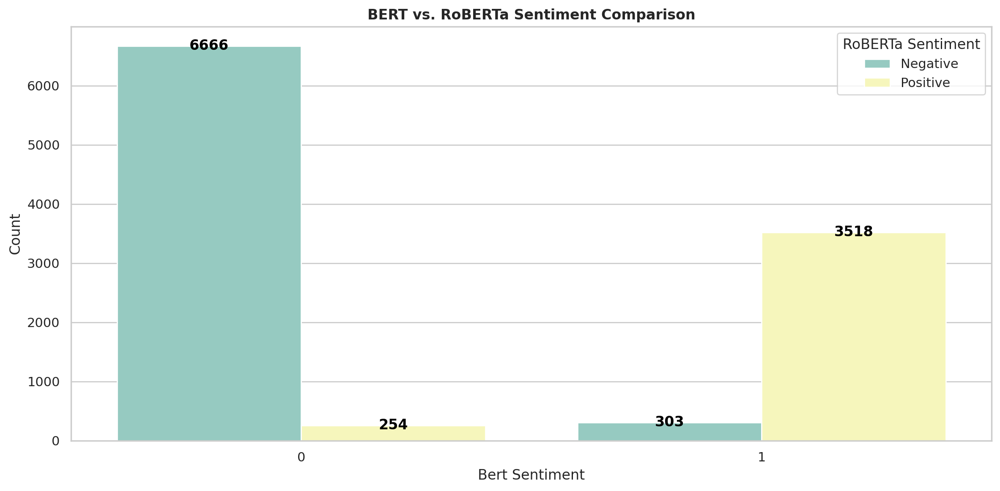

In [112]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

analysis_dataset_path = "analysis.csv"
analysis_df = pd.read_csv(analysis_dataset_path)

# Filter the DataFrame to include only Bert and RoBERTa sentiments
analysis_df = analysis_df[['Bert_Sentiment', 'RoBERTa_Sentiment']]

sns.set(style="whitegrid")

# Count the occurrences of each combination of Bert and RoBERTa sentiments
sentiment_counts = analysis_df.groupby(['Bert_Sentiment', 'RoBERTa_Sentiment']).size().reset_index(name='Count')

plt.figure(figsize=(12, 6))
sns.barplot(data=sentiment_counts, x='Bert_Sentiment', y='Count', hue='RoBERTa_Sentiment', palette="Set3", ci=None)
plt.xlabel('Bert Sentiment')
plt.ylabel('Count')
plt.title('BERT vs. RoBERTa Sentiment Comparison', fontweight='bold')
plt.legend(title='RoBERTa Sentiment', loc='upper right', labels=['Negative', 'Positive'])

for p in plt.gca().patches:
    plt.gca().annotate(f'{int(p.get_height())}', (p.get_x() + p.get_width() / 2., p.get_height() + 5),
                       ha='center', va='center', fontsize=12, color='black', fontweight='bold')

plt.tight_layout()
plt.show()


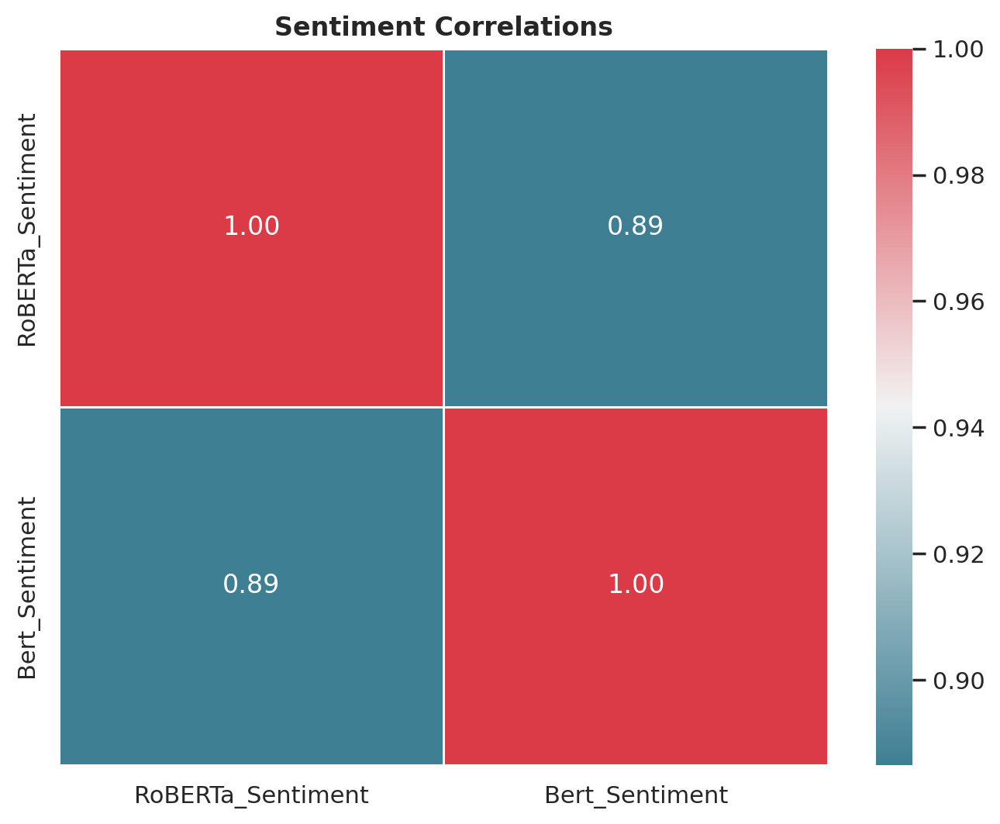

In [113]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt


sentiment_columns = ['RoBERTa_Sentiment', 'Bert_Sentiment']

correlation_matrix = df[sentiment_columns].corr()

plt.figure(figsize=(8, 6))
cmap = sns.diverging_palette(220, 10, as_cmap=True)
sns.heatmap(correlation_matrix, annot=True, cmap=cmap, fmt=".2f", linewidths=.5)
plt.title('Sentiment Correlations', fontweight='bold')
plt.show()


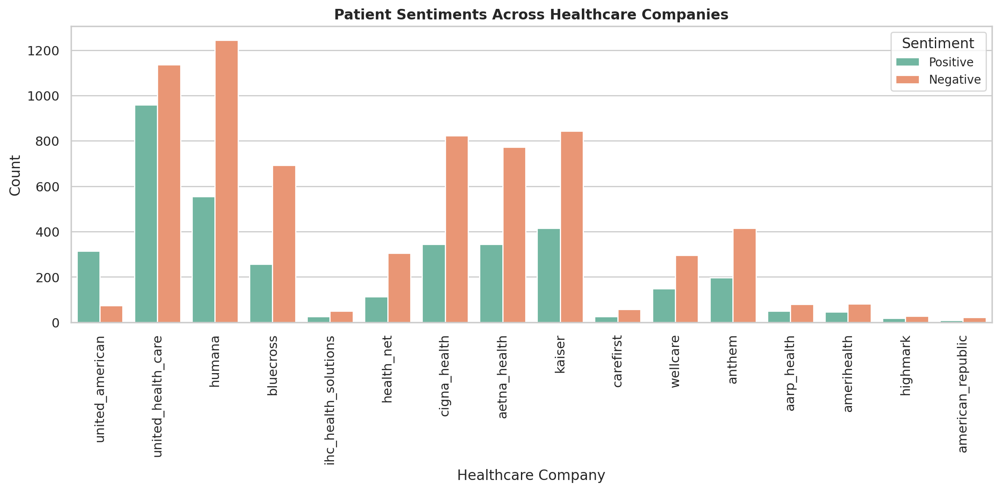

In [114]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

sns.set(style="whitegrid")

plt.figure(figsize=(12, 6))
sns.countplot(data=df, x='CompanyName', hue='Sentiment', palette="Set2")
plt.xlabel('Healthcare Company')
plt.ylabel('Count')
plt.title('Patient Sentiments Across Healthcare Companies', fontweight='bold')
plt.xticks(rotation=90)

plt.tight_layout()
plt.legend(title='Sentiment', title_fontsize='12', fontsize='10', loc='upper right', labels=['Positive', 'Negative'])
plt.show()


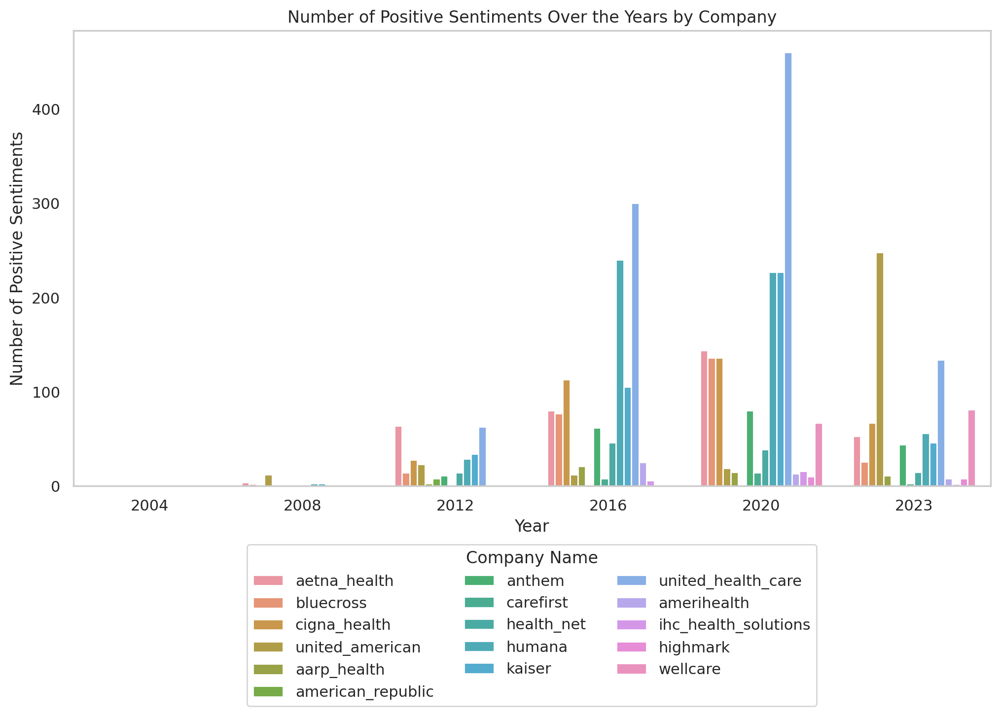

In [117]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

df['Year'] = df['Date'].dt.year  # Extract the year component from the 'Date' column
df['4-Year Interval'] = df['Year'] // 4 * 4

sentiment_counts = df.groupby(['4-Year Interval', 'CompanyName', 'Sentiment'])['ID'].count().reset_index()

sentiment_counts_pivot = sentiment_counts.pivot_table(index=['4-Year Interval', 'CompanyName'], columns='Sentiment', values='ID', fill_value=0)

sentiment_counts_pivot = sentiment_counts_pivot.reset_index()

plt.figure(figsize=(12, 6))
ax = sns.barplot(x='4-Year Interval', y='positive', hue='CompanyName', data=sentiment_counts_pivot)
plt.xlabel('Year')
plt.ylabel('Number of Positive Sentiments')
plt.title('Number of Positive Sentiments Over the Years by Company')
plt.legend(title='Company Name', loc='lower center', bbox_to_anchor=(0.5, -0.5), ncol=3)  # Adjust bbox_to_anchor
plt.grid(axis='y')

x_labels = ['2004', '2008', '2012', '2016', '2020', '2023']
ax.set_xticklabels(x_labels)

plt.show()


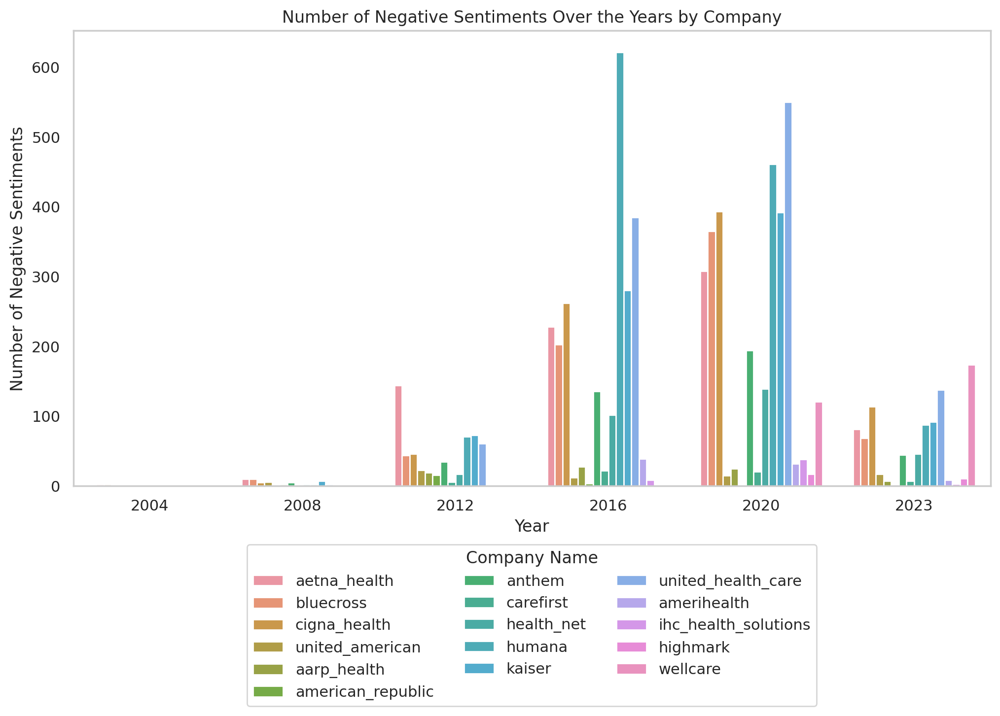

In [118]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

df['Year'] = df['Date'].dt.year  # Extract the year component from the 'Date' column
df['4-Year Interval'] = df['Year'] // 4 * 4

sentiment_counts = df.groupby(['4-Year Interval', 'CompanyName', 'Sentiment'])['ID'].count().reset_index()

sentiment_counts_pivot = sentiment_counts.pivot_table(index=['4-Year Interval', 'CompanyName'], columns='Sentiment', values='ID', fill_value=0)

sentiment_counts_pivot = sentiment_counts_pivot.reset_index()

plt.figure(figsize=(12, 6))
ax = sns.barplot(x='4-Year Interval', y='negative', hue='CompanyName', data=sentiment_counts_pivot)
plt.xlabel('Year')
plt.ylabel('Number of Negative Sentiments')
plt.title('Number of Negative Sentiments Over the Years by Company')
plt.legend(title='Company Name', loc='lower center', bbox_to_anchor=(0.5, -0.5), ncol=3)  # Adjust bbox_to_anchor
plt.grid(axis='y')

x_labels = ['2004', '2008', '2012', '2016', '2020', '2023']
ax.set_xticklabels(x_labels)

plt.show()


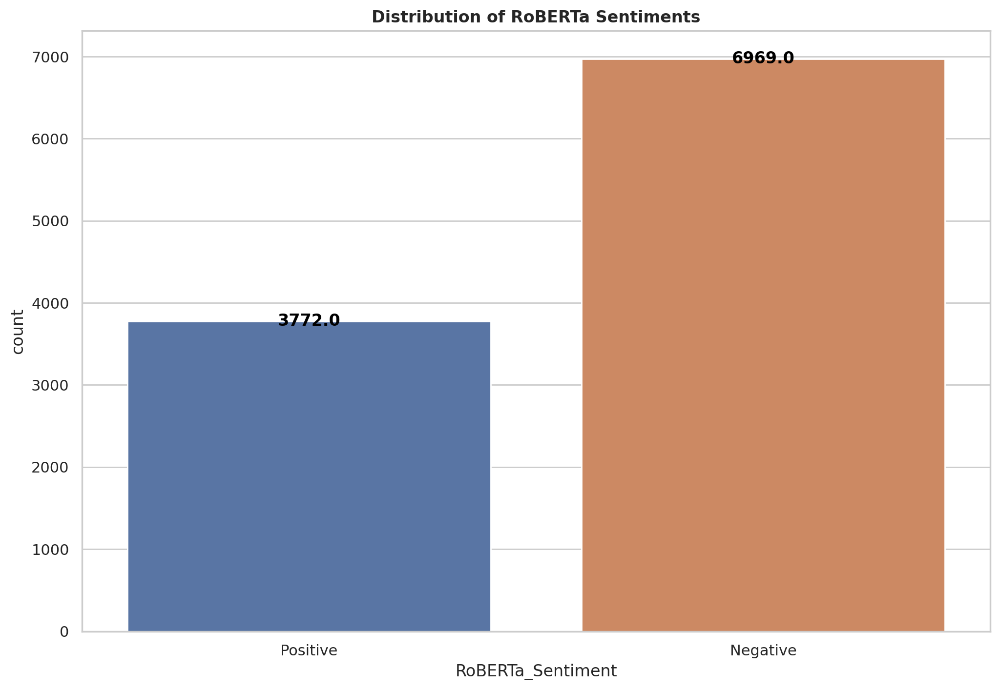

In [119]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

analysis_dataset_path = "analysis.csv"
analysis_df = pd.read_csv(analysis_dataset_path)

analysis_df['Sentiment_Label'] = analysis_df['RoBERTa_Sentiment'].map({0: 'Negative', 1: 'Positive'})

sns.set(style="whitegrid")

ax = sns.countplot(data=analysis_df, x='Sentiment_Label')
plt.xlabel('RoBERTa_Sentiment')

plt.title('Distribution of RoBERTa Sentiments', fontweight='bold')

for p in ax.patches:
    ax.annotate(f'{p.get_height()}', (p.get_x() + p.get_width() / 2., p.get_height() + 5),
                ha='center', va='center', fontsize=12, color='black', fontweight='bold')


plt.show()

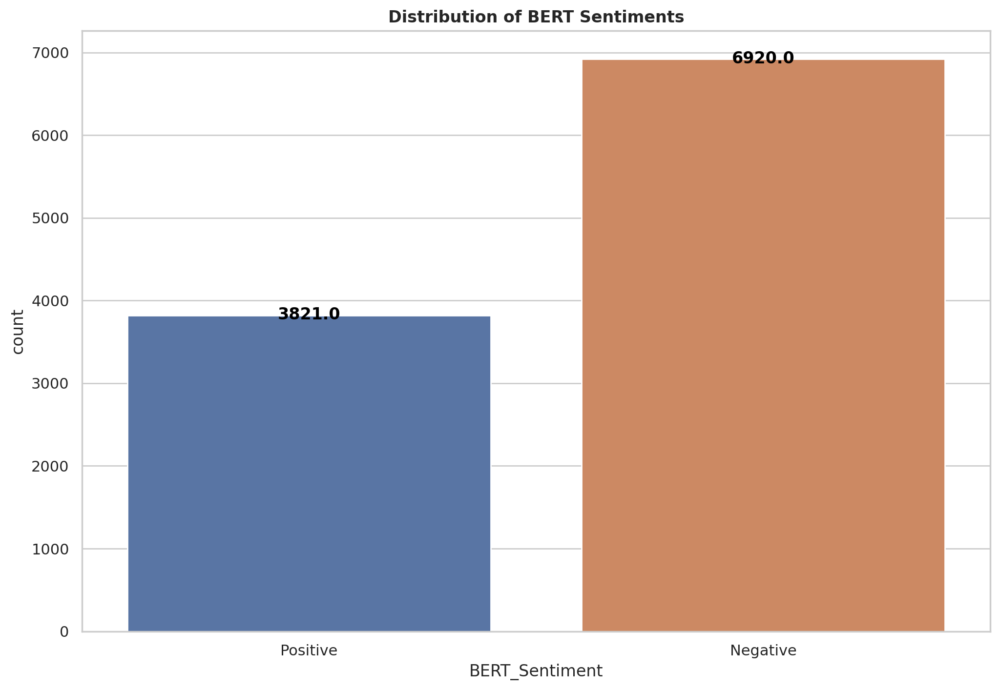

In [120]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

analysis_dataset_path = "analysis.csv"
analysis_df = pd.read_csv(analysis_dataset_path)

analysis_df['Sentiment_Label'] = analysis_df['Bert_Sentiment'].map({0: 'Negative', 1: 'Positive'})

sns.set(style="whitegrid")

ax = sns.countplot(data=analysis_df, x='Sentiment_Label')
plt.xlabel('BERT_Sentiment')

plt.title('Distribution of BERT Sentiments', fontweight='bold')

for p in ax.patches:
    ax.annotate(f'{p.get_height()}', (p.get_x() + p.get_width() / 2., p.get_height() + 5),
                ha='center', va='center', fontsize=12, color='black', fontweight='bold')

plt.show()

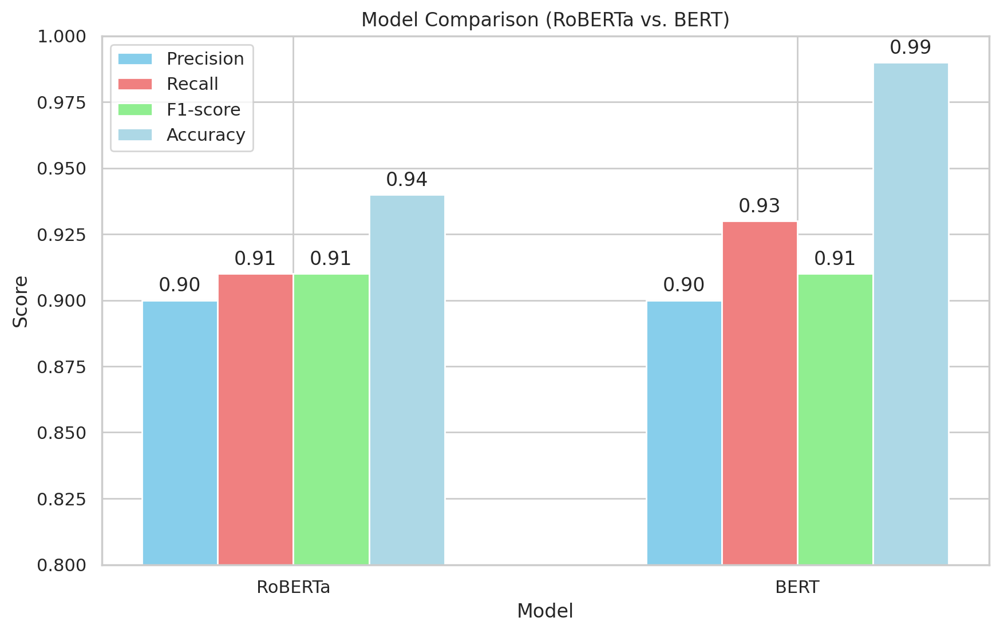

In [122]:
import matplotlib.pyplot as plt

# Model names and their corresponding metrics
model_names = ['RoBERTa', 'BERT']
precision = [0.90, 0.90]
recall = [0.91, 0.93]
f1_score = [0.91, 0.91]
accuracy = [0.94, 0.99]  # Add accuracy values

# Create a bar chart for model comparison
plt.figure(figsize=(10, 6))
bar_width = 0.15  # Adjust bar width for better spacing
index = range(len(model_names))

bars1 = plt.bar(index, precision, bar_width, label='Precision', color='skyblue')
bars2 = plt.bar([i + bar_width for i in index], recall, bar_width, label='Recall', color='lightcoral')
bars3 = plt.bar([i + 2 * bar_width for i in index], f1_score, bar_width, label='F1-score', color='lightgreen')
bars4 = plt.bar([i + 3 * bar_width for i in index], accuracy, bar_width, label='Accuracy', color='lightblue')

plt.xlabel('Model')
plt.ylabel('Score')
plt.title('Model Comparison (RoBERTa vs. BERT)')
plt.xticks([i + 1.5 * bar_width for i in index], model_names)
plt.legend(loc='upper left')
plt.ylim(0.8, 1.0)

# Adding values on top of the bars
for bars in [bars1, bars2, bars3, bars4]:
    for bar in bars:
        height = bar.get_height()
        plt.annotate(f'{height:.2f}', xy=(bar.get_x() + bar.get_width() / 2, height),
                     xytext=(0, 3),  # 3 points vertical offset
                     textcoords="offset points",
                     ha='center', va='bottom')

plt.show()
